# Climate Change Impact on Birds

In [1]:
import pandas as pd
import numpy as np

xls=pd.ExcelFile("NCRN LAND Bird Monitoring Data 2007 - 2017_Public.xlsx")
sheets=xls.sheet_names

In [2]:
print(sheets)

['ANTI', 'CATO', 'CHOH', 'GWMP', 'HAFE', 'MANA', 'MONO', 'NACE', 'PRWI', 'ROCR', 'WOTR']


In [3]:
parks=['Antietam National Battlefield', 'Catoctin Mountain Park', 'Chesapeake & Ohio Canal National Historical Park', 'George Washington Memorial Parkway', 'Harpers Ferry National Historical Park', 'Manassas National Battlefield Park', 'Monocacy National Battlefield', 'National Capital Parks - East', 'Prince William Forest Park', 'Rock Creek Park', 'Wolf Trap National Park for the Performing Arts']

In [4]:
nat_parks=dict(zip(sheets, parks))
print(nat_parks)

{'ANTI': 'Antietam National Battlefield', 'CATO': 'Catoctin Mountain Park', 'CHOH': 'Chesapeake & Ohio Canal National Historical Park', 'GWMP': 'George Washington Memorial Parkway', 'HAFE': 'Harpers Ferry National Historical Park', 'MANA': 'Manassas National Battlefield Park', 'MONO': 'Monocacy National Battlefield', 'NACE': 'National Capital Parks - East', 'PRWI': 'Prince William Forest Park', 'ROCR': 'Rock Creek Park', 'WOTR': 'Wolf Trap National Park for the Performing Arts'}


In [5]:
dfs={sheet:pd.read_excel(xls, sheet) for sheet in sheets}

In [6]:
df=pd.concat(dfs.values(), ignore_index=True)

In [7]:
df['National Parks']=df['Admin_Unit_Code'].map(nat_parks)

In [8]:
df.isnull().sum()

Admin_Unit_Code                     0
Sub_Unit_Code                  118425
Site_Name                       28386
Plot_Name                           0
Location_Type                      16
Year                                0
Date                                0
Start_Time                         13
End_Time                           13
Observer                            0
Visit                               0
Interval_Length                     3
ID_Method                        4079
Distance                         7324
Flyover_Observed                    0
Sex                              5313
Common_Name                         3
Scientific_Name                     3
AcceptedTSN                       308
NPSTaxonCode                        3
AOU_Code                            3
PIF_Watchlist_Status                0
Regional_Stewardship_Status         0
Temperature                        10
Humidity                           99
Sky                                10
Wind        

In [9]:
df.shape

(126573, 30)

In [10]:
print(df.sample(5))

       Admin_Unit_Code Sub_Unit_Code Site_Name  Plot_Name Location_Type  Year  \
57150             HAFE           NaN    HAFE 2  HAFE-0053        Forest  2011   
1321              ANTI           NaN    ANTI 2  ANTI-0190        Forest  2016   
9042              ANTI           NaN       NaN  ANTI-0183     Grassland  2016   
87278             NACE          OXHI   NACE 4a  NACE-0346        Forest  2009   
109438            PRWI           NaN   PRWI 15  PRWI-0504        Forest  2013   

             Date Start_Time  End_Time          Observer  ...  AOU_Code  \
57150  2011-05-22   08:36:00  08:47:00  Elizabeth Tymkiw  ...      BHCO   
1321   2016-05-24   06:32:00  06:42:00     Conor Higgins  ...      CHSP   
9042   2016-06-18   09:05:00  09:15:00    Brendan Hobart  ...      TRES   
87278  2009-06-04   05:57:00  06:07:00       Zak Poulton  ...      ETTI   
109438 2013-06-09   08:22:00  08:32:00    Molly Albecker  ...      BLJA   

       PIF_Watchlist_Status Regional_Stewardship_Status Temper

In [29]:
df=df.dropna(subset=['Plot_Name','Location_Type', 'Date', 'Common_Name', 'Scientific_Name', 'Temperature', 'Humidity', 'Sky', 'Wind', 'Disturbance'])

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 126455 entries, 0 to 126572
Data columns (total 30 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   Admin_Unit_Code              126455 non-null  object        
 1   Sub_Unit_Code                8138 non-null    object        
 2   Site_Name                    98069 non-null   object        
 3   Plot_Name                    126455 non-null  object        
 4   Location_Type                126455 non-null  object        
 5   Year                         126455 non-null  int64         
 6   Date                         126455 non-null  datetime64[ns]
 7   Start_Time                   126442 non-null  object        
 8   End_Time                     126442 non-null  object        
 9   Observer                     126455 non-null  object        
 10  Visit                        126455 non-null  int64         
 11  Interval_Length              12

In [31]:
df.describe()

,Year,Date,Visit,AcceptedTSN,NPSTaxonCode,Temperature,Humidity
count,126455.000000,126455,126455.000000,126150.000000,126455.000000,126455.000000,126455.000000
mean,2012.870199,2013-04-29 09:44:44.050452736,1.589190,237476.842806,131002.583156,20.745349,76.213215
min,2007.000000,2007-05-04 00:00:00,1.000000,93549.000000,0.000000,0.000000,0.000000
25%,2010.000000,2010-06-22 00:00:00,1.000000,178532.000000,85846.000000,18.200001,71.800003
50%,2014.000000,2014-05-22 00:00:00,2.000000,179112.000000,88296.000000,21.100000,80.000000
75%,2016.000000,2016-05-25 00:00:00,2.000000,179759.000000,94215.000000,23.600000,86.300003
max,2017.000000,2017-07-19 00:00:00,4.000000,950106.000000,926917.000000,43.500000,99.000000
std,3.219391,NaN,0.618818,169537.534618,146469.062563,4.597715,17.101756


In [32]:
df.isnull().sum()

Admin_Unit_Code                     0
Sub_Unit_Code                  118317
Site_Name                       28386
Plot_Name                           0
Location_Type                       0
Year                                0
Date                                0
Start_Time                         13
End_Time                           13
Observer                            0
Visit                               0
Interval_Length                     0
ID_Method                        4076
Distance                         7317
Flyover_Observed                    0
Sex                              5310
Common_Name                         0
Scientific_Name                     0
AcceptedTSN                       305
NPSTaxonCode                        0
AOU_Code                            0
PIF_Watchlist_Status                0
Regional_Stewardship_Status         0
Temperature                         0
Humidity                            0
Sky                                 0
Wind        

In [33]:
df.duplicated().sum()

np.int64(6119)

In [34]:
df.shape

(126455, 30)

In [15]:
num_cols=df.select_dtypes(include=[int, float])
print(num_cols.columns)

Index(['Year', 'Visit', 'AcceptedTSN', 'NPSTaxonCode', 'Temperature',
       'Humidity'],
      dtype='object')


In [16]:
selected_num_cols=['Year', 'Visit', 'Temperature', 'Humidity']

In [17]:
corr_mat=df[selected_num_cols].corr()
print(corr_mat)

                 Year     Visit  Temperature  Humidity
Year         1.000000  0.145086     0.078158  0.092303
Visit        0.145086  1.000000     0.329851  0.134016
Temperature  0.078158  0.329851     1.000000  0.093281
Humidity     0.092303  0.134016     0.093281  1.000000


In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

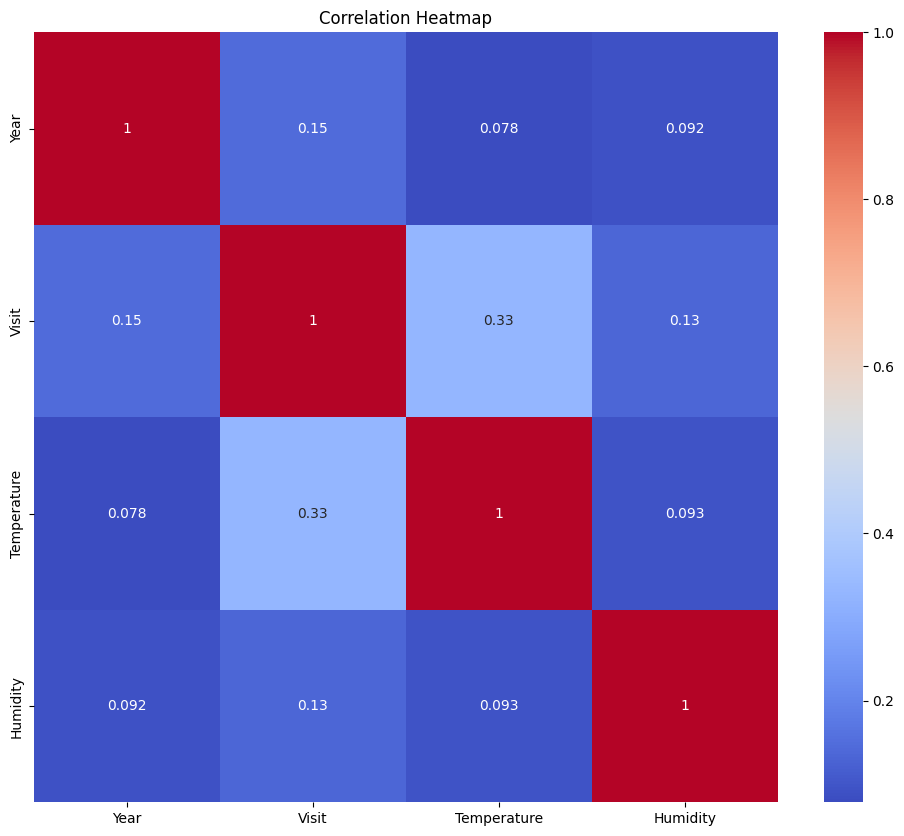

In [19]:
plt.figure(figsize=(12, 10))
sns.heatmap(corr_mat, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

In [20]:
cat_cols=df.select_dtypes(include=['object','category']).columns
print(cat_cols)

Index(['Admin_Unit_Code', 'Sub_Unit_Code', 'Site_Name', 'Plot_Name',
       'Location_Type', 'Start_Time', 'End_Time', 'Observer',
       'Interval_Length', 'ID_Method', 'Distance', 'Sex', 'Common_Name',
       'Scientific_Name', 'AOU_Code', 'Sky', 'Wind', 'Disturbance',
       'National Parks'],
      dtype='object')


In [21]:
selected_cat_columns=['National Parks','Location_Type', 'Sex', 'Sky', 'Wind', 'Disturbance']

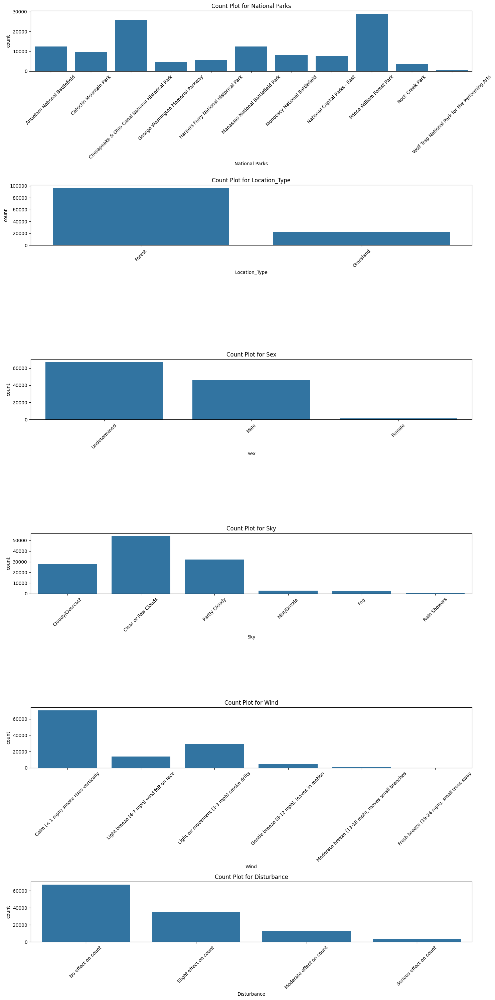

In [22]:
fig, axes = plt.subplots(len(selected_cat_columns), 1, figsize=(15, 5 * len(selected_cat_columns)))

for ax, column in zip(axes, selected_cat_columns):
    sns.countplot(data=df, x=column, ax=ax)
    ax.set_title(f'Count Plot for {column}')
    ax.tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

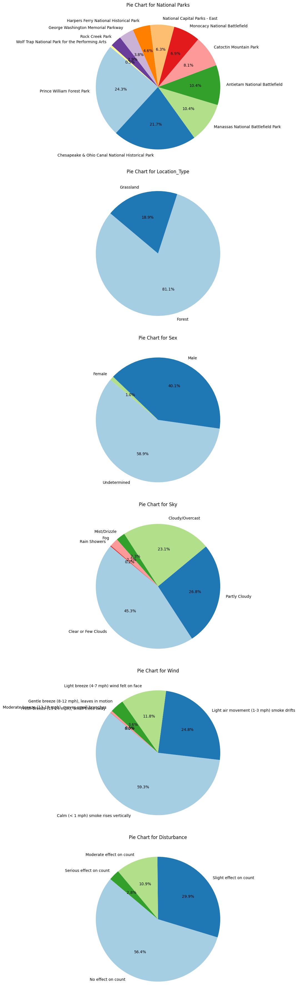

In [23]:
fig, axes=plt.subplots(len(selected_cat_columns), 1, figsize=(10, 6*len(selected_cat_columns)))

for ax, column in zip(axes, selected_cat_columns):
    data=df[column].value_counts()
    ax.pie(data, labels=data.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.Paired.colors)
    ax.set_title(f'Pie Chart for {column}')

plt.tight_layout()
plt.show()

(array([ 8899.,  9835.,  7513.,  8718.,  8411.,  7609.,  9648., 13449.,
        15084., 29987.]),
 array([2007., 2008., 2009., 2010., 2011., 2012., 2013., 2014., 2015.,
        2016., 2017.]),
 <BarContainer object of 10 artists>)

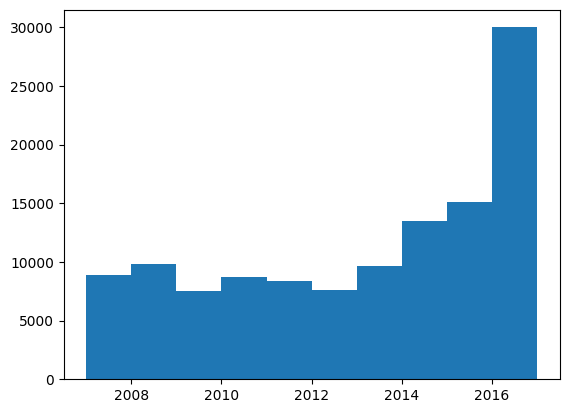

In [24]:
plt.hist(df['Year'])

Text(0.5, 1.0, 'Distribution of Temperature')

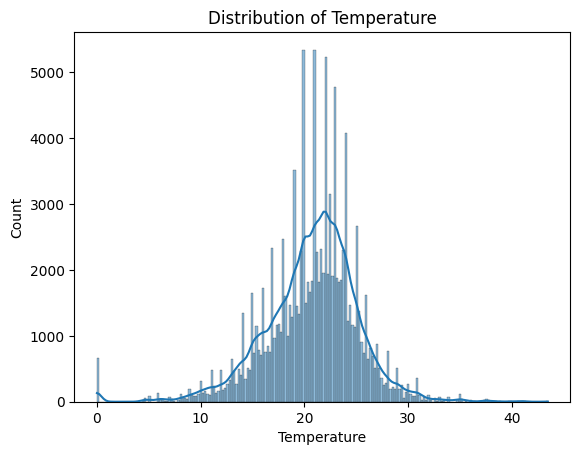

In [25]:
sns.histplot(df['Temperature'], kde=True)
plt.title('Distribution of Temperature')

Text(0.5, 1.0, 'Distribution of Humidity')

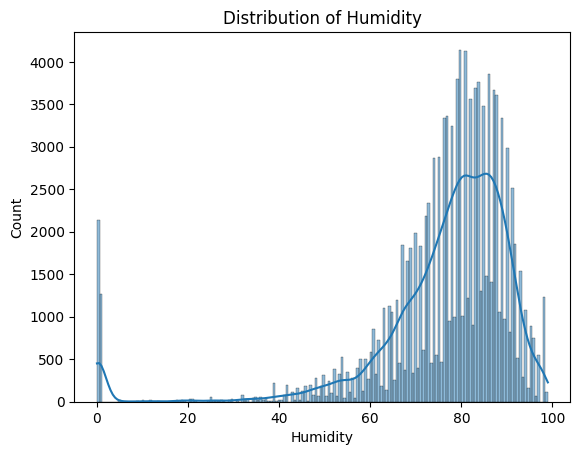

In [26]:
sns.histplot(df['Humidity'], kde=True)
plt.title('Distribution of Humidity')

Analysis for Antietam National Battlefield
              Year                           Date         Visit  \
count  12339.00000                          12339  12339.000000   
mean    2015.35173  2015-10-24 01:56:14.179431168      1.847394   
min     2007.00000            2007-05-11 00:00:00      1.000000   
25%     2015.00000            2015-06-22 00:00:00      1.000000   
50%     2016.00000            2016-05-24 00:00:00      2.000000   
75%     2017.00000            2017-05-28 00:00:00      2.000000   
max     2017.00000            2017-07-17 00:00:00      3.000000   
std        2.11237                            NaN      0.780686   

         AcceptedTSN   NPSTaxonCode   Temperature      Humidity  
count   12241.000000   12339.000000  12339.000000  12339.000000  
mean   204358.435259  109869.800551     22.026890     78.446965  
min    174999.000000       0.000000      0.000000      0.000000  
25%    178620.000000   84820.000000     18.700001     73.000000  
50%    179150.000000   

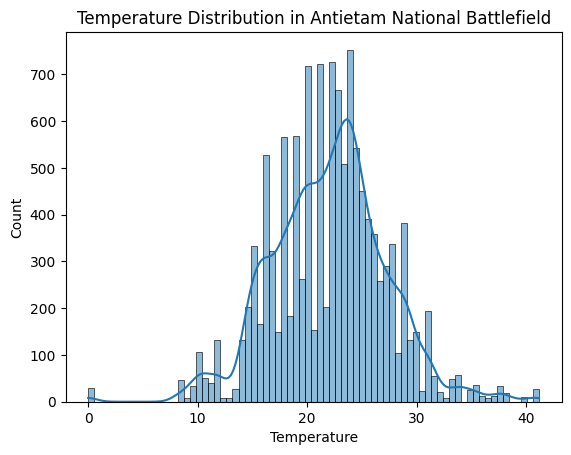

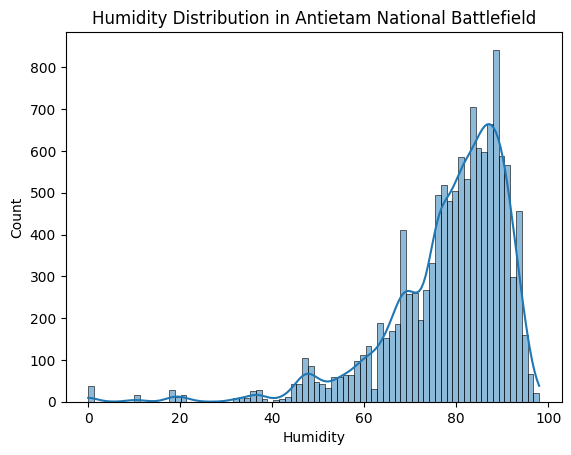

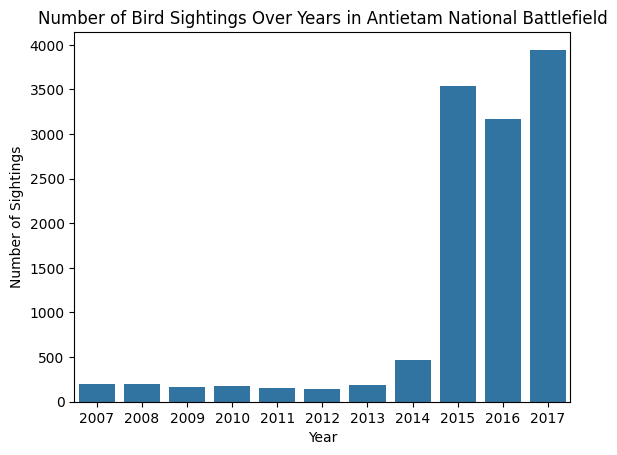

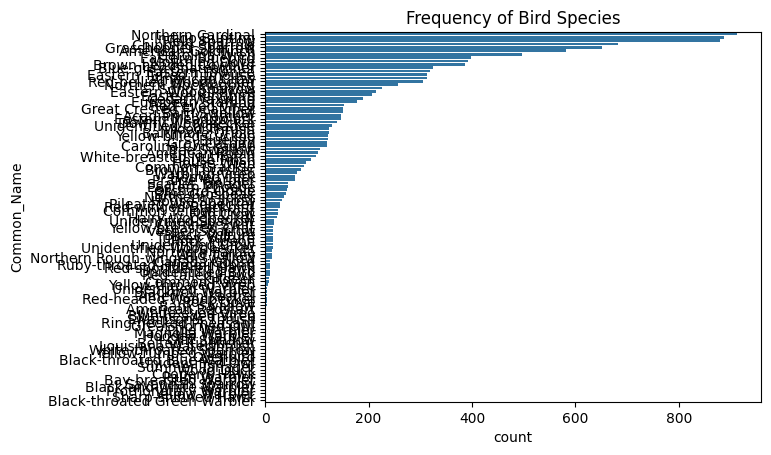

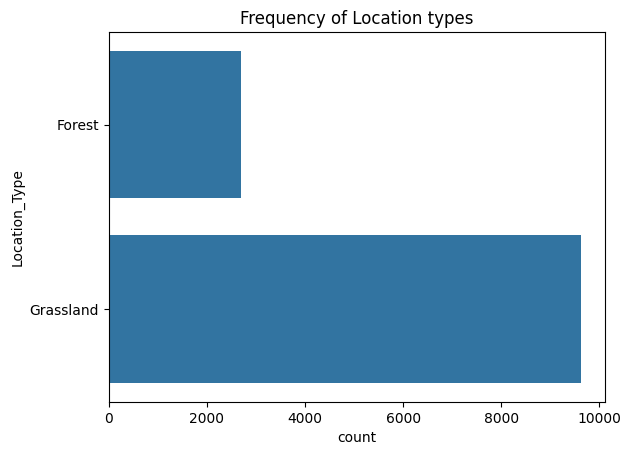

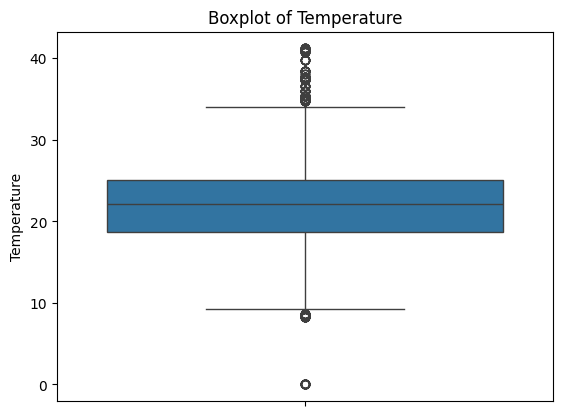

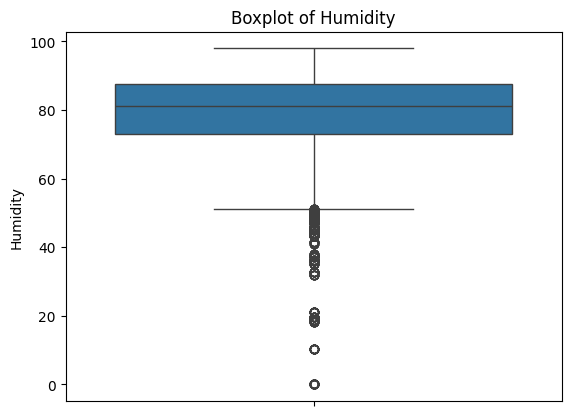

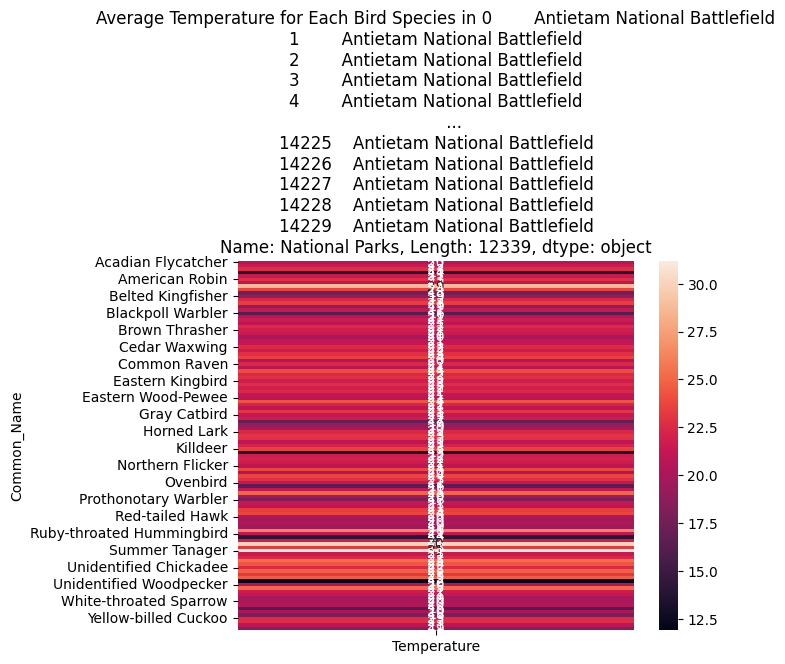

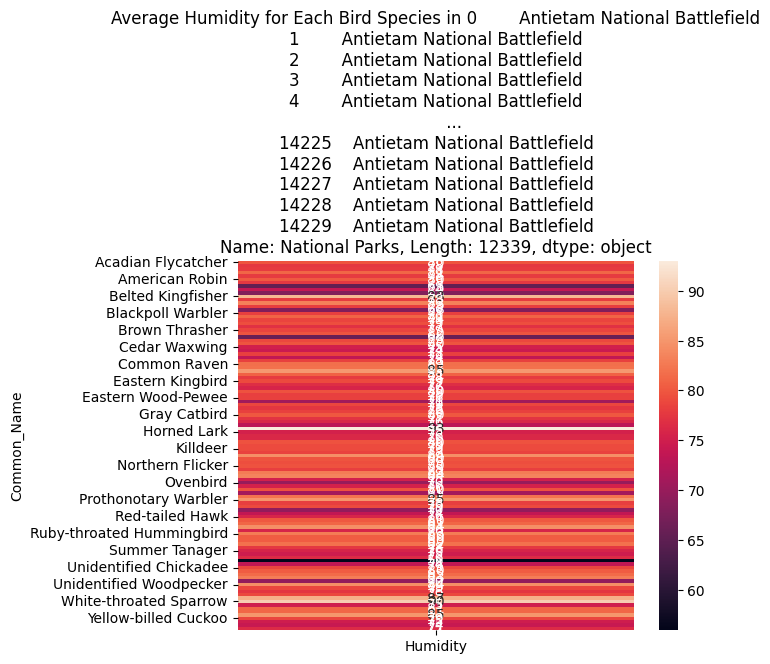

Analysis for Catoctin Mountain Park
              Year                           Date        Visit    AcceptedTSN  \
count  9700.000000                           9700  9700.000000    9696.000000   
mean   2011.920206  2012-05-20 19:31:00.123711488     1.489794  226830.856745   
min    2007.000000            2007-05-21 00:00:00     1.000000  174773.000000   
25%    2009.000000            2009-07-13 00:00:00     1.000000  178359.000000   
50%    2012.000000            2012-07-05 00:00:00     1.000000  179021.000000   
75%    2015.000000            2015-06-16 00:00:00     2.000000  179777.000000   
max    2017.000000            2017-07-02 00:00:00     2.000000  950097.000000   
std       3.182562                            NaN     0.499922  156744.028261   

        NPSTaxonCode  Temperature     Humidity  
count    9700.000000  9700.000000  9700.000000  
mean   121395.748351    19.721454    75.627467  
min         0.000000     0.000000     0.000000  
25%     85846.000000    17.799999    7

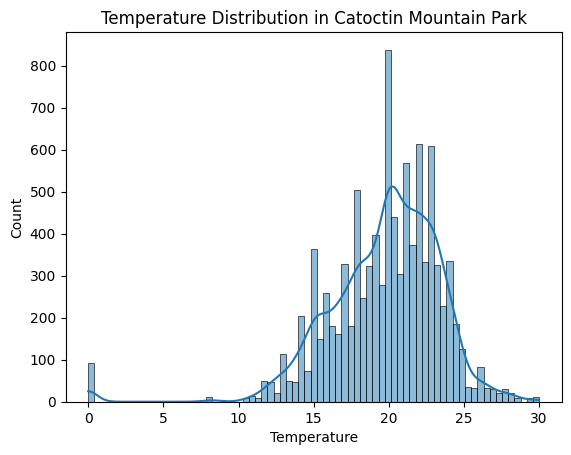

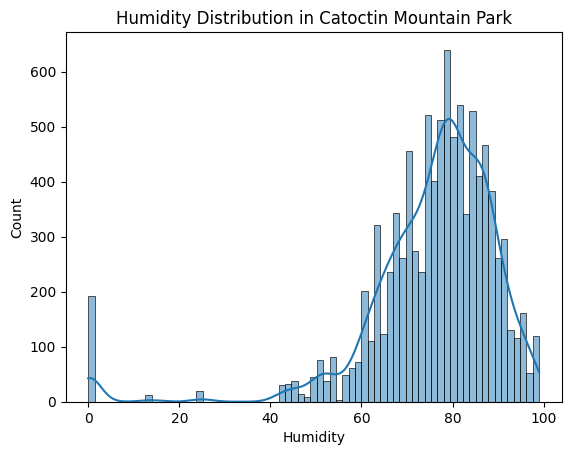

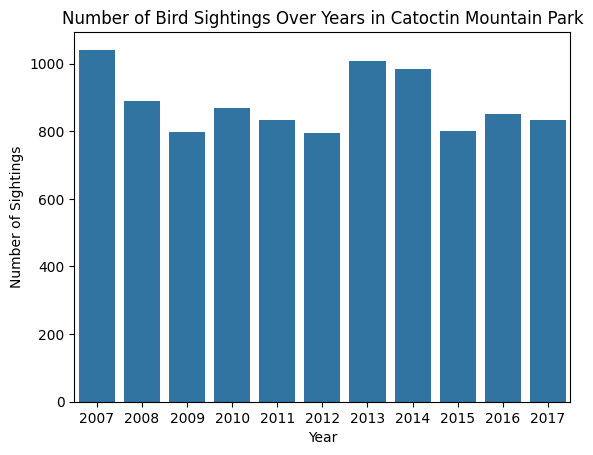

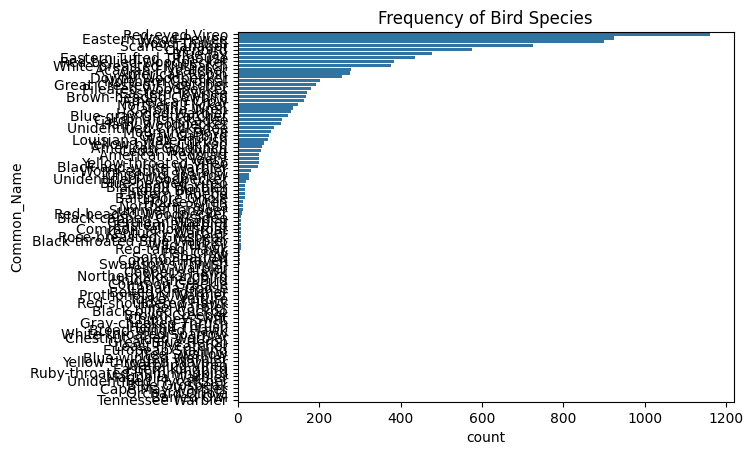

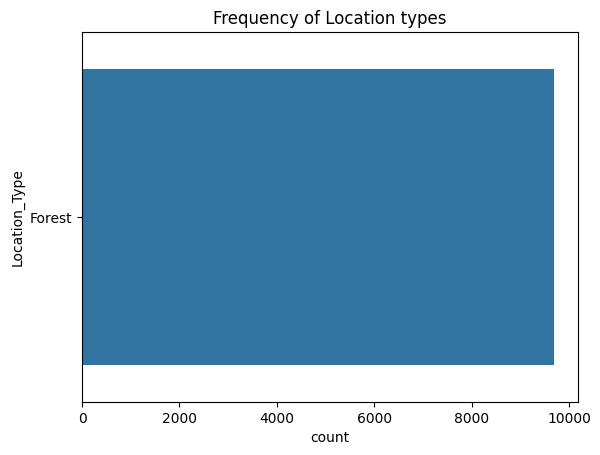

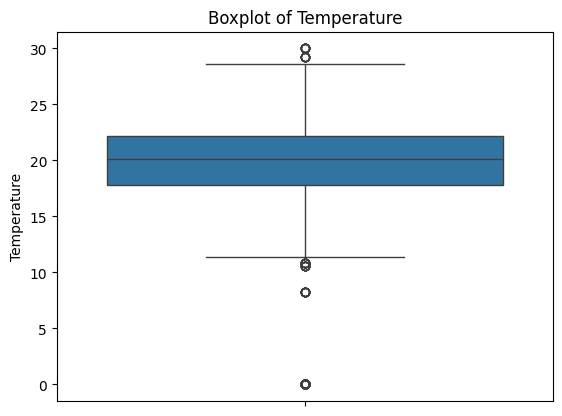

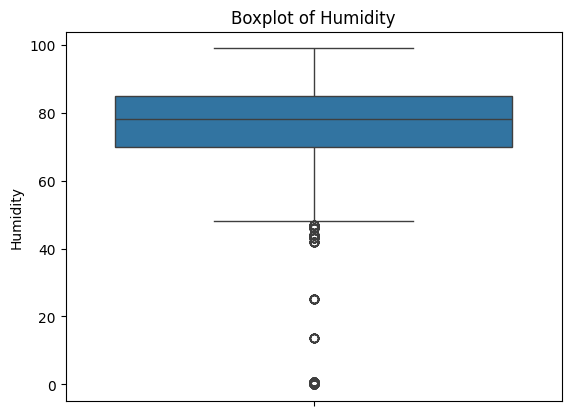

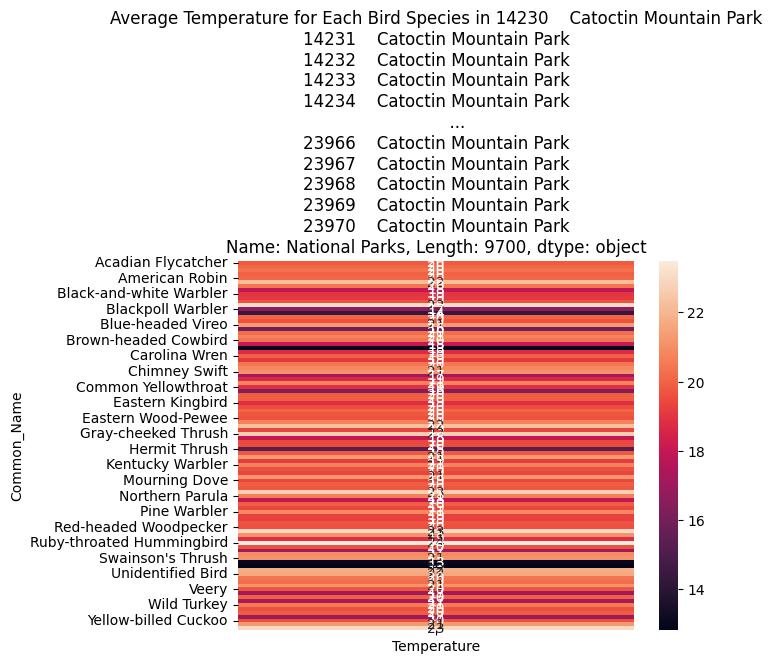

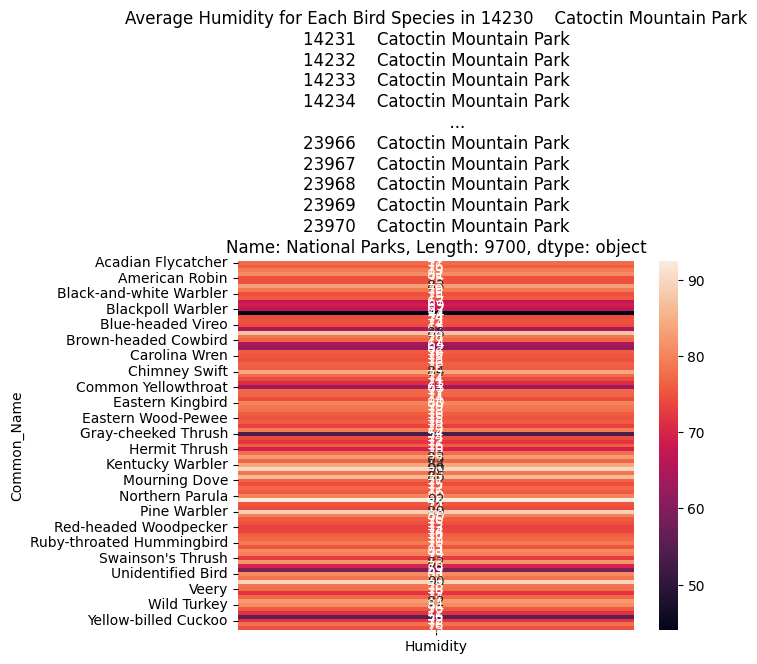

Analysis for Chesapeake & Ohio Canal National Historical Park
               Year                           Date         Visit  \
count  25888.000000                          25888  25888.000000   
mean    2012.021439  2012-06-24 02:22:37.231149568      1.479489   
min     2007.000000            2007-05-04 00:00:00      1.000000   
25%     2009.000000            2009-07-15 00:00:00      1.000000   
50%     2012.000000            2012-07-04 00:00:00      1.000000   
75%     2015.000000            2015-05-28 00:00:00      2.000000   
max     2017.000000            2017-07-11 00:00:00      4.000000   
std        3.145701                            NaN      0.504054   

         AcceptedTSN   NPSTaxonCode   Temperature      Humidity  
count   25869.000000   25888.000000  25888.000000  25888.000000  
mean   248990.978623  137648.540289     20.945900     74.194304  
min    174650.000000       0.000000      0.000000      0.000000  
25%    178359.000000   85846.000000     19.000000     70.0000

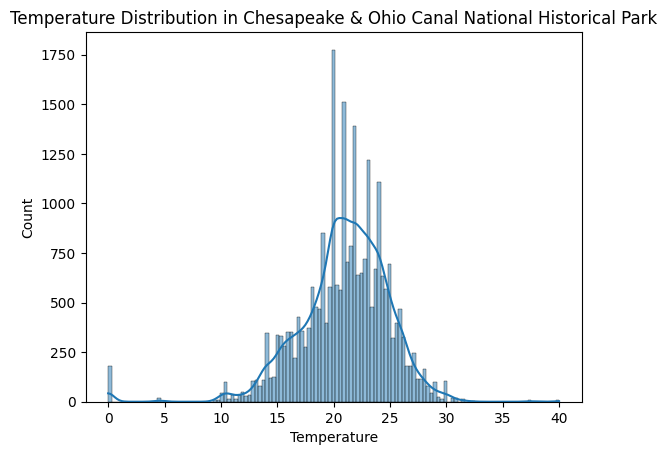

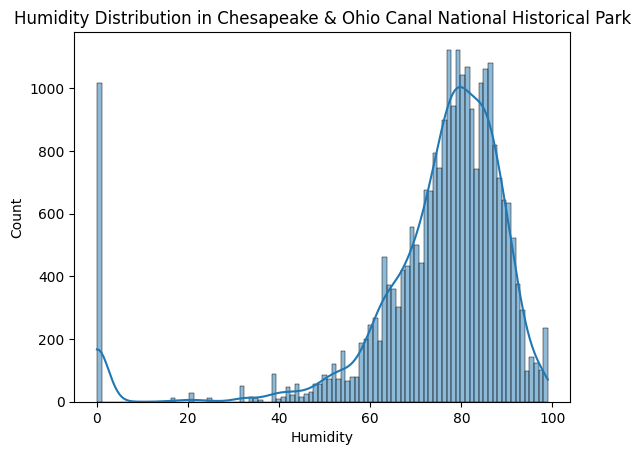

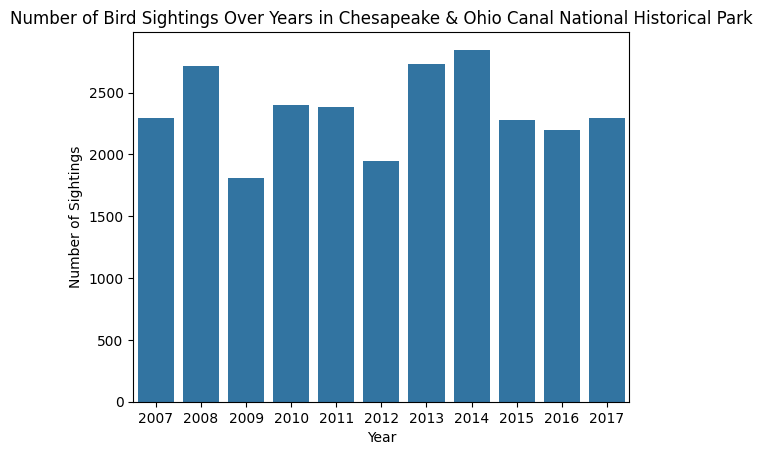

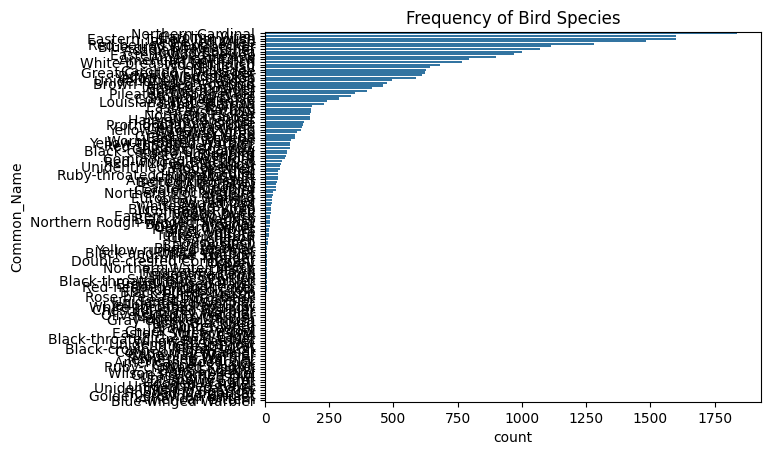

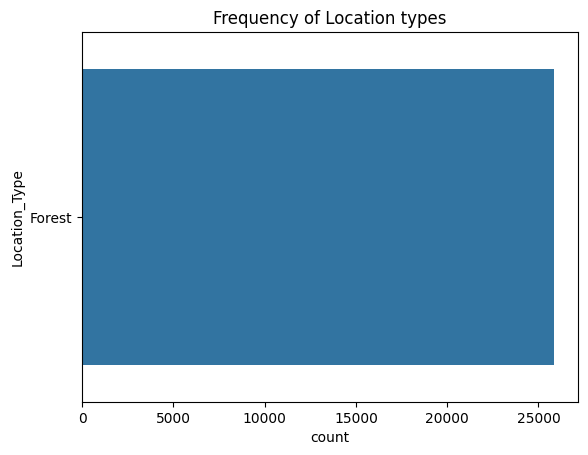

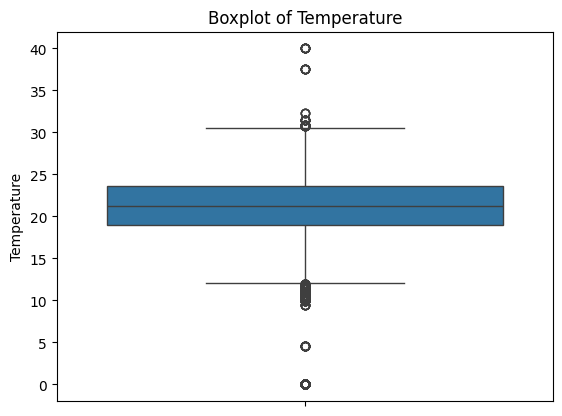

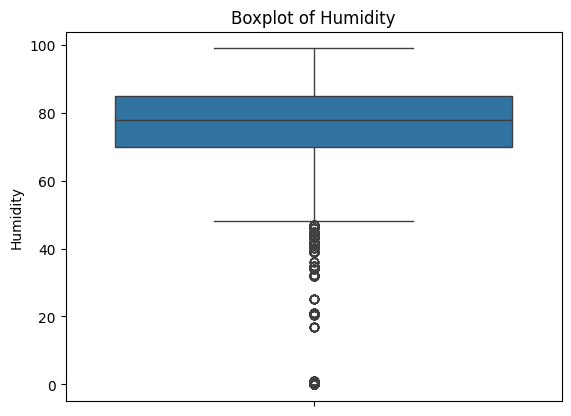

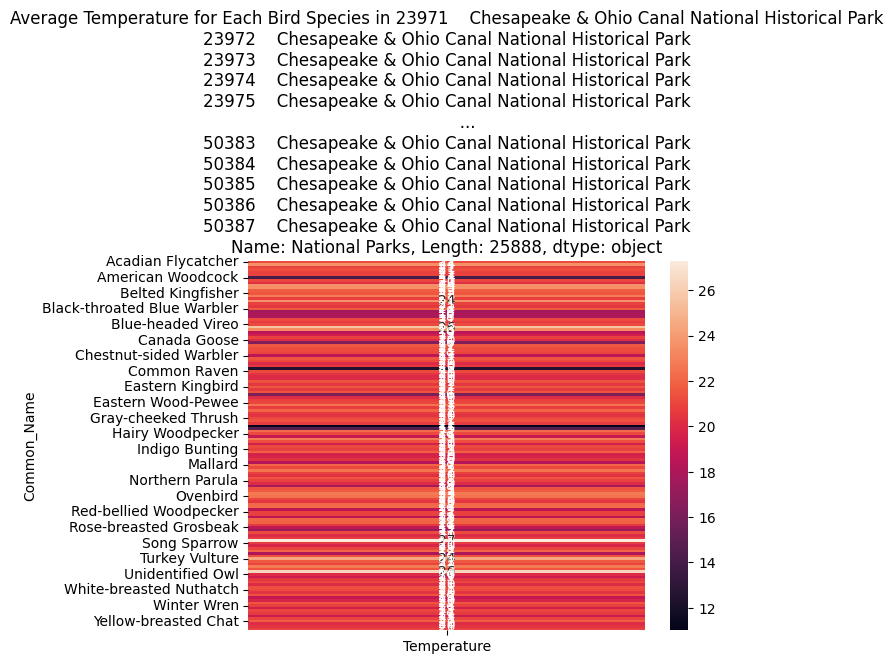

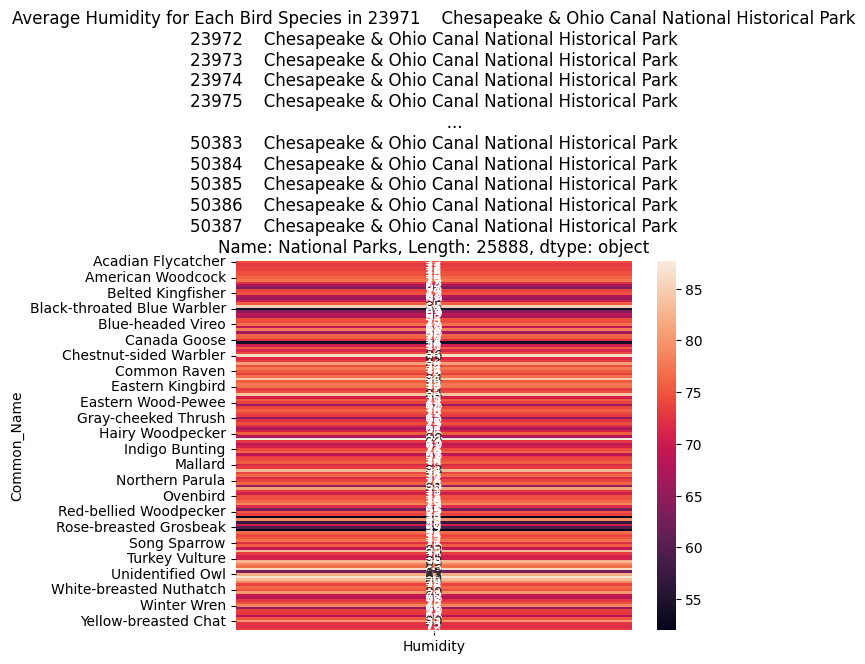

Analysis for George Washington Memorial Parkway
              Year                           Date        Visit    AcceptedTSN  \
count  4563.000000                           4563  4563.000000    4551.000000   
mean   2011.732851  2012-03-01 17:51:42.958579712     1.480386  247378.836519   
min    2007.000000            2007-05-04 00:00:00     1.000000  174717.000000   
25%    2009.000000            2009-06-03 00:00:00     1.000000  178581.000000   
50%    2012.000000            2012-05-23 00:00:00     1.000000  179124.000000   
75%    2014.000000            2014-06-16 00:00:00     2.000000  179777.000000   
max    2017.000000            2017-07-19 00:00:00     2.000000  950079.000000   
std       3.114551                            NaN     0.499670  173514.942925   

        NPSTaxonCode  Temperature     Humidity  
count    4563.000000  4563.000000  4563.000000  
mean   132928.260136    20.302630    76.574701  
min         0.000000     9.000000     0.000000  
25%     86252.000000    18

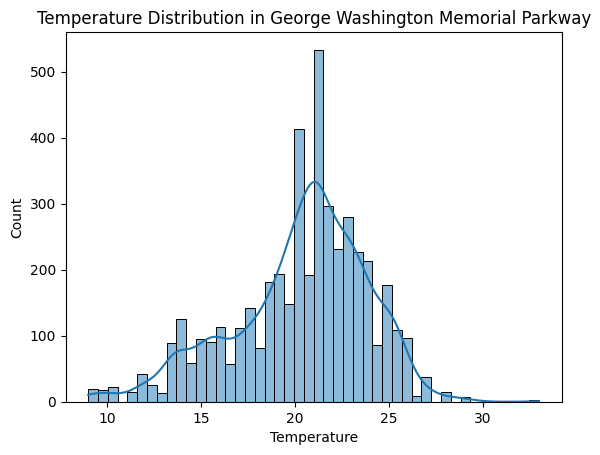

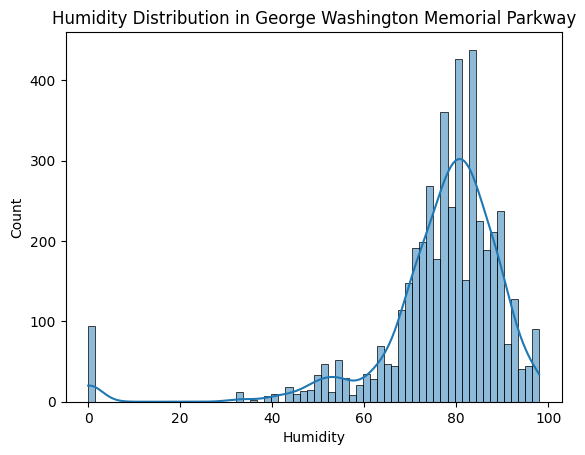

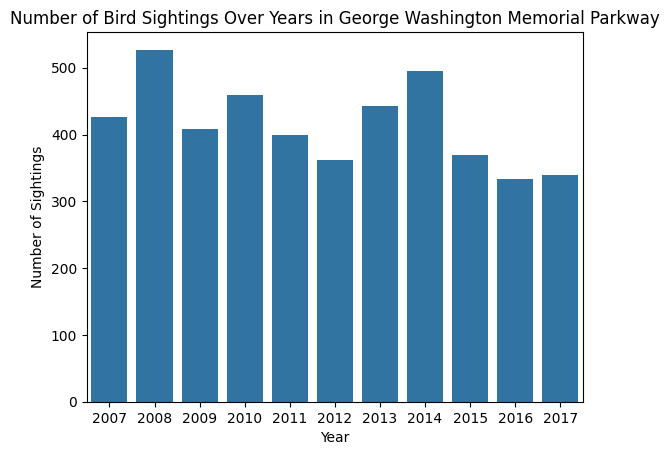

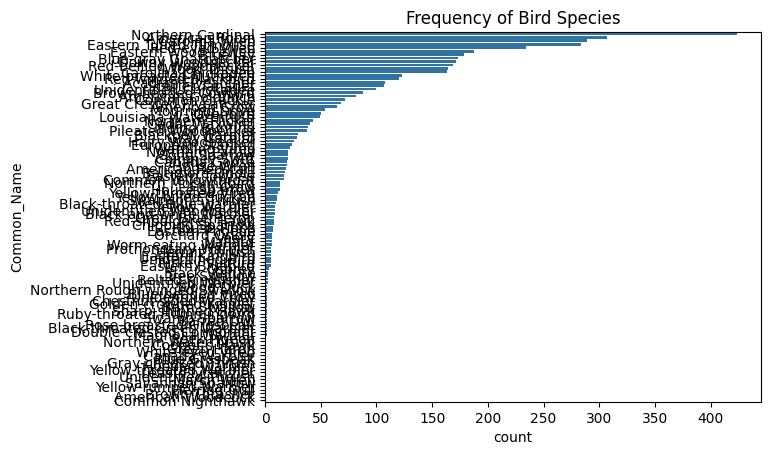

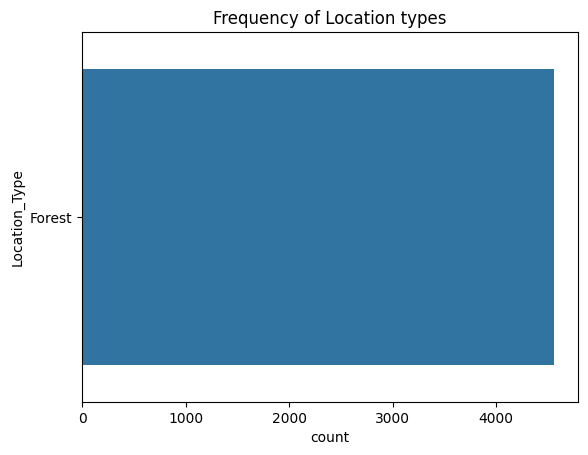

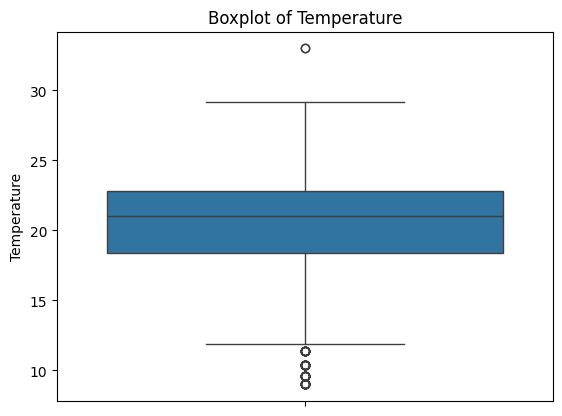

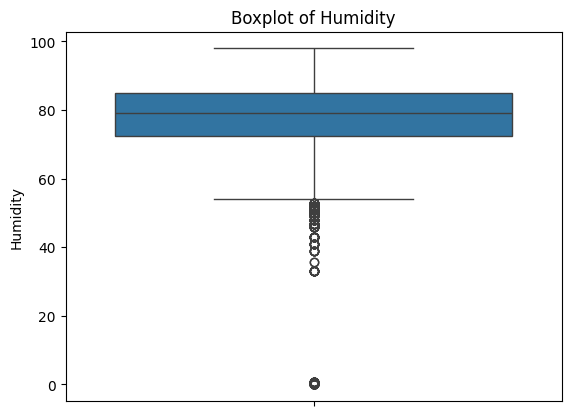

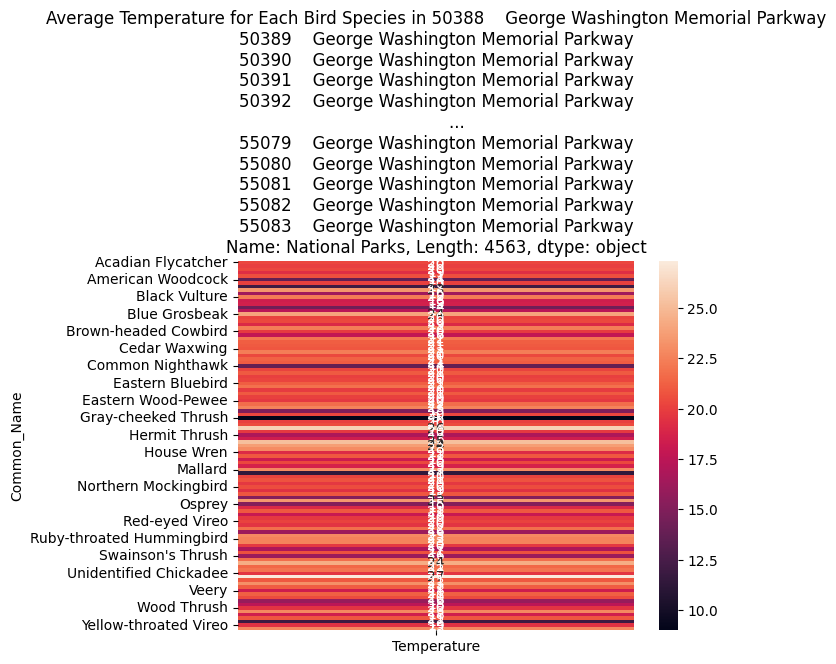

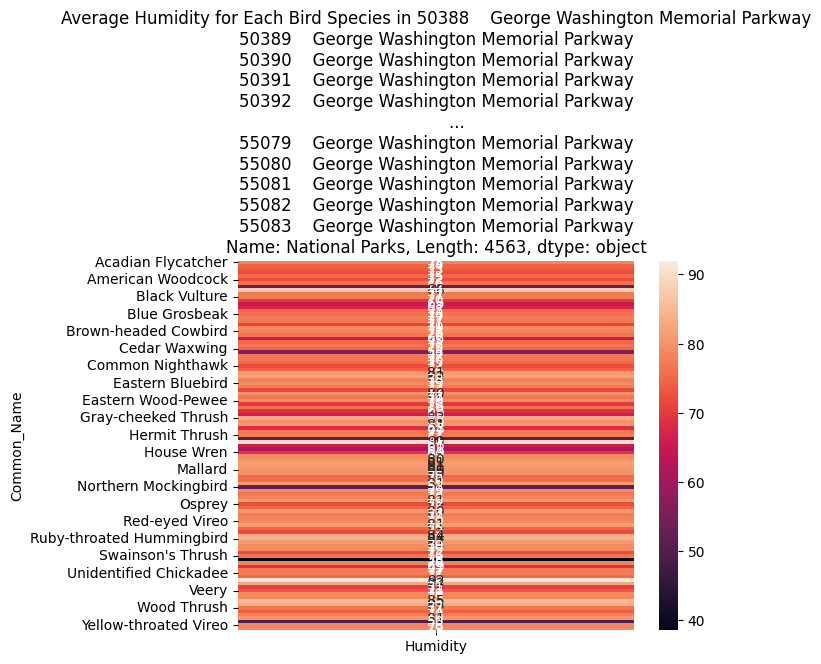

Analysis for Harpers Ferry National Historical Park
              Year                           Date        Visit    AcceptedTSN  \
count  5436.000000                           5436  5436.000000    5419.000000   
mean   2012.093267  2012-07-14 03:52:34.966887424     1.526858  228532.243218   
min    2007.000000            2007-05-16 00:00:00     1.000000   93549.000000   
25%    2009.000000            2009-06-29 00:00:00     1.000000  178359.000000   
50%    2012.000000            2012-07-02 00:00:00     2.000000  179112.000000   
75%    2015.000000            2015-05-29 00:00:00     2.000000  179759.000000   
max    2017.000000            2017-07-09 00:00:00     3.000000  950106.000000   
std       3.202624                            NaN     0.512777  141330.640740   

        NPSTaxonCode  Temperature     Humidity  
count    5436.000000  5436.000000  5436.000000  
mean   119065.886681    20.543598    73.740992  
min         0.000000     0.000000     0.000000  
25%     85846.000000  

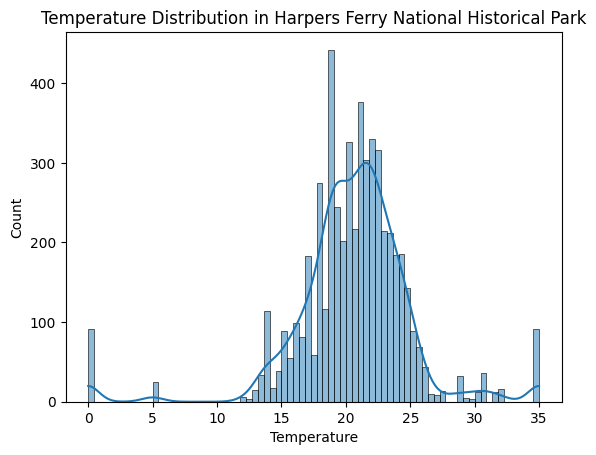

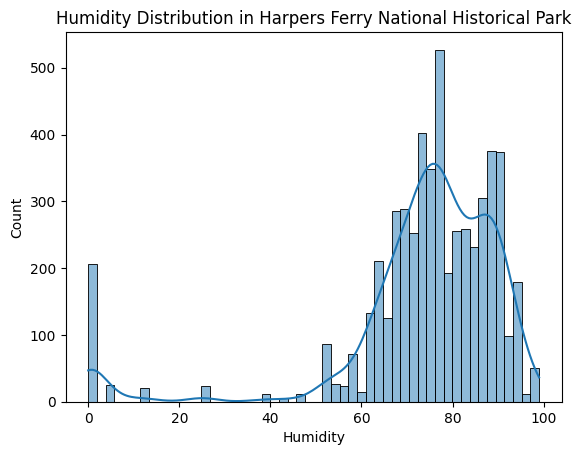

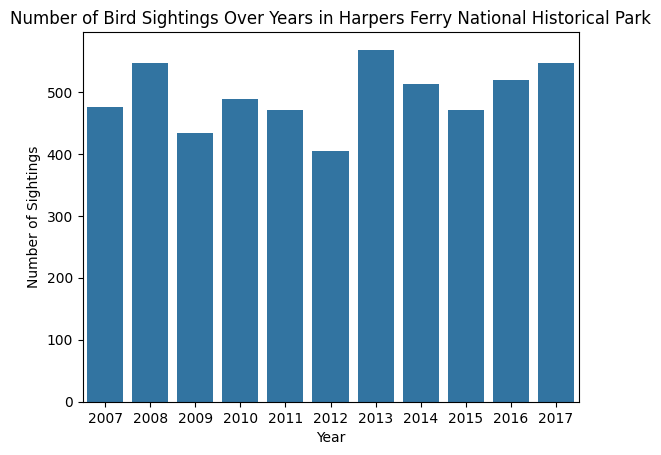

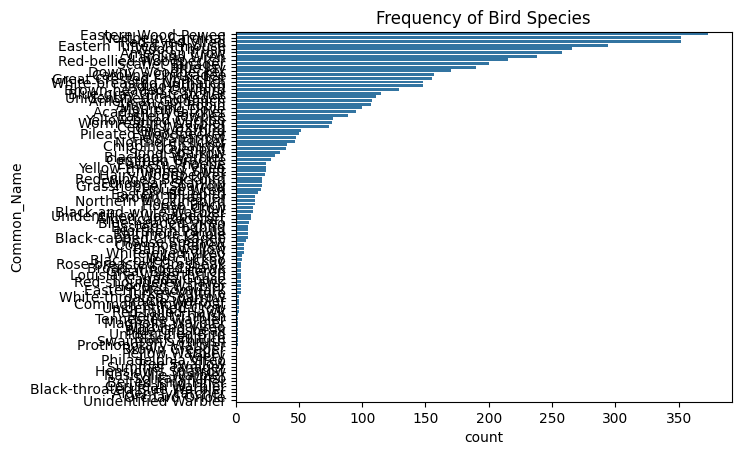

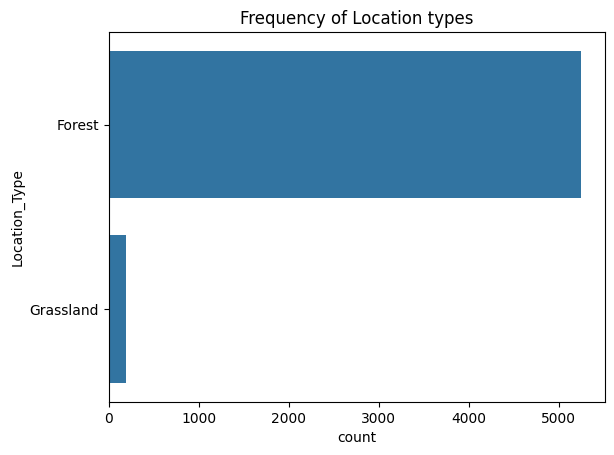

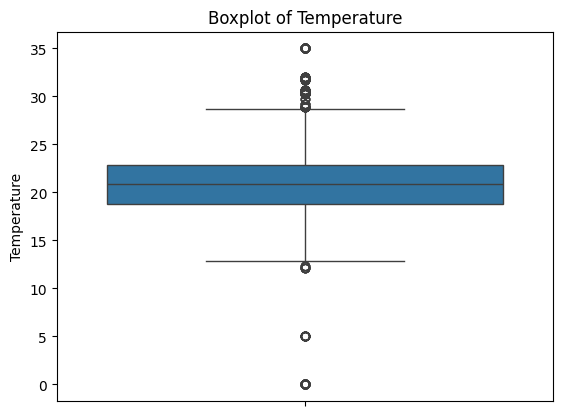

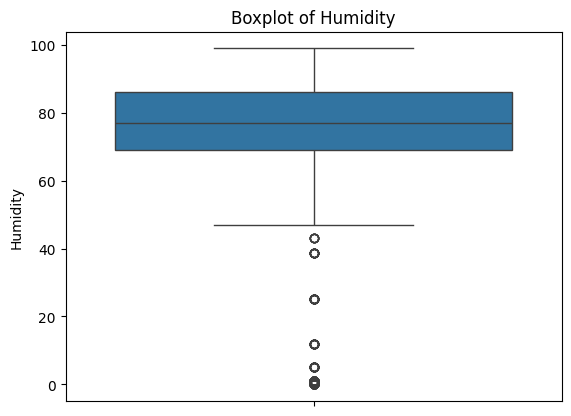

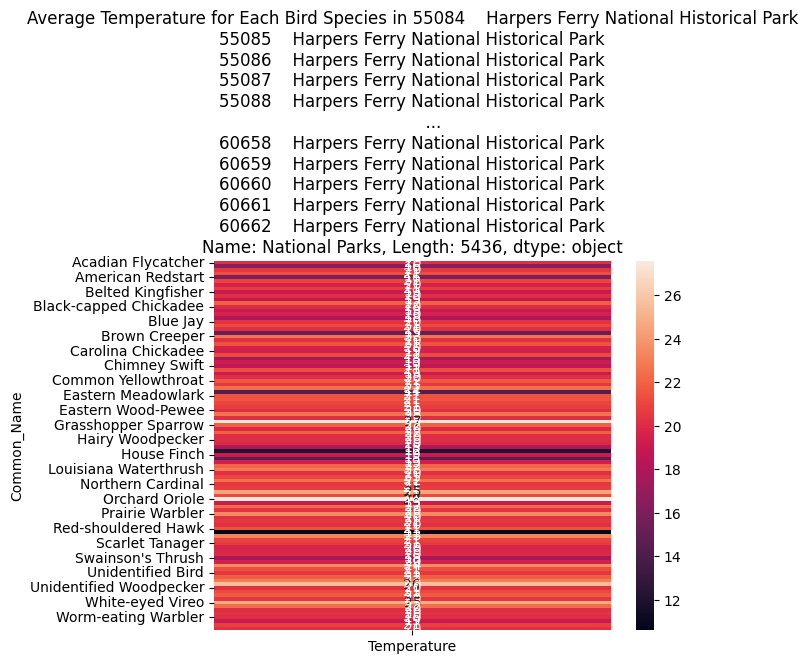

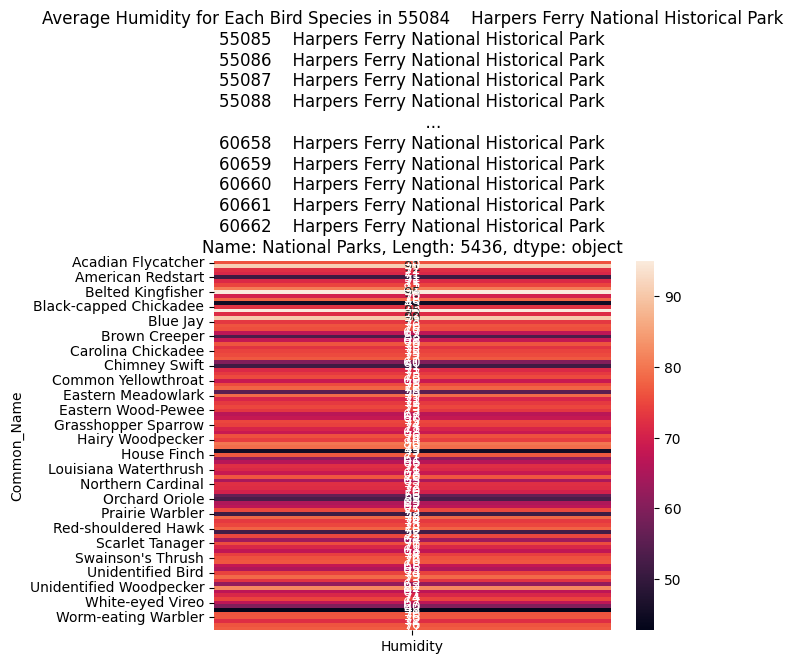

Analysis for Manassas National Battlefield Park
               Year                           Date         Visit  \
count  12431.000000                          12431  12431.000000   
mean    2013.517497  2013-12-15 16:20:00.096532992      1.703403   
min     2007.000000            2007-05-08 00:00:00      1.000000   
25%     2012.000000            2012-05-30 00:00:00      1.000000   
50%     2014.000000            2014-06-11 00:00:00      2.000000   
75%     2016.000000            2016-05-20 00:00:00      2.000000   
max     2017.000000            2017-07-13 00:00:00      3.000000   
std        2.907669                            NaN      0.716850   

         AcceptedTSN   NPSTaxonCode   Temperature      Humidity  
count   12405.000000   12431.000000  12431.000000  12431.000000  
mean   243054.976139  138551.354517     19.755354     73.981590  
min    174773.000000       0.000000      0.000000      0.000000  
25%    178775.000000   85846.000000     15.800000     67.000000  
50%    17

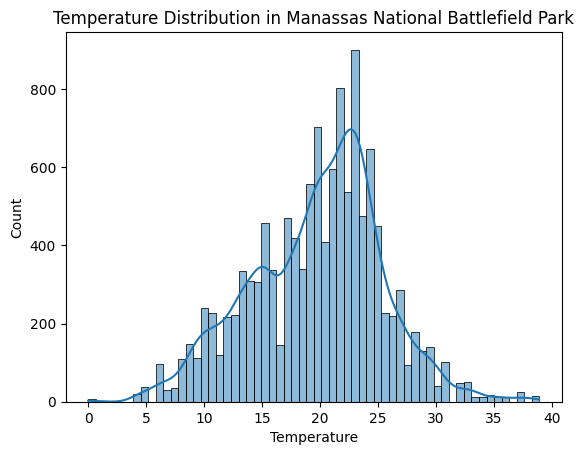

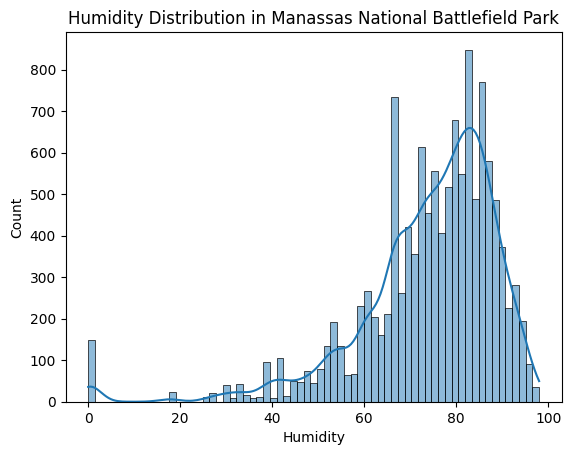

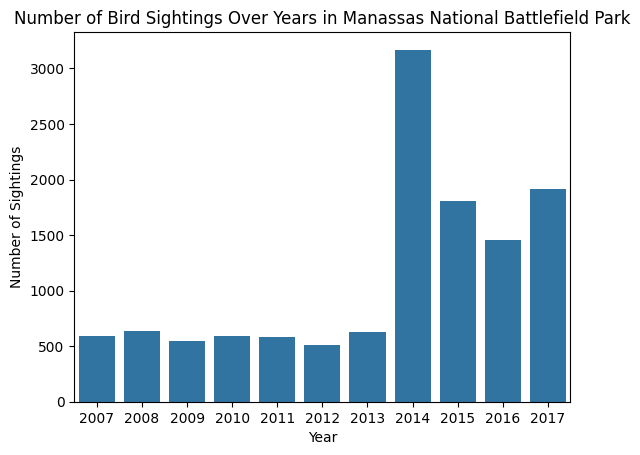

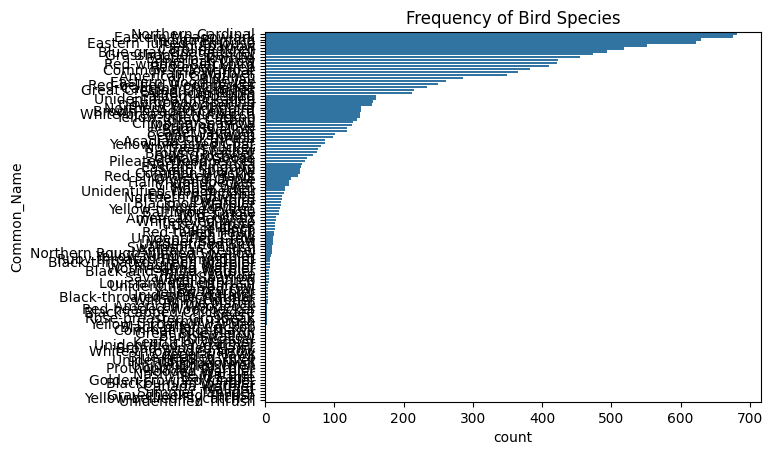

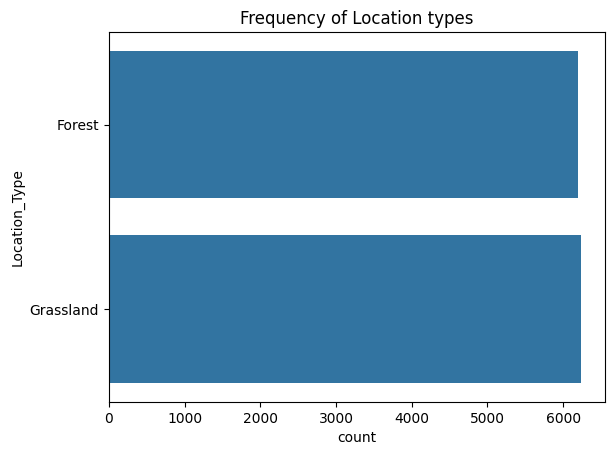

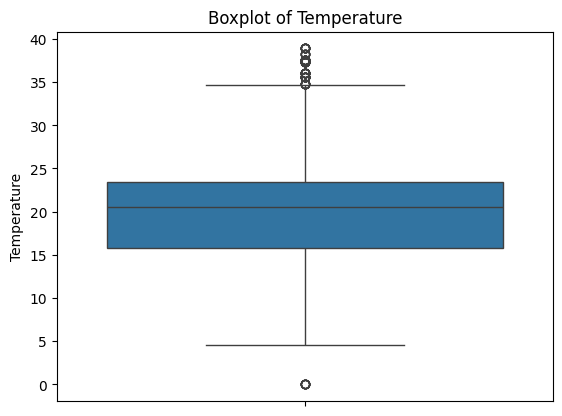

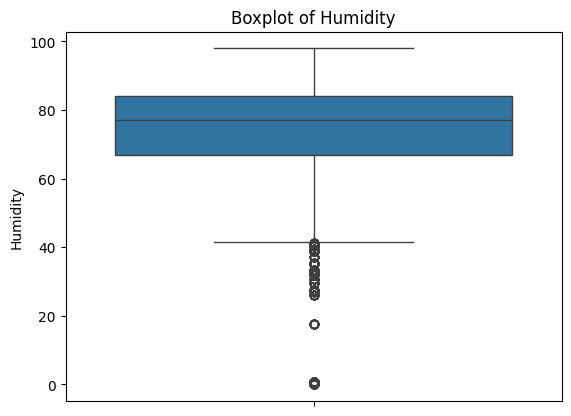

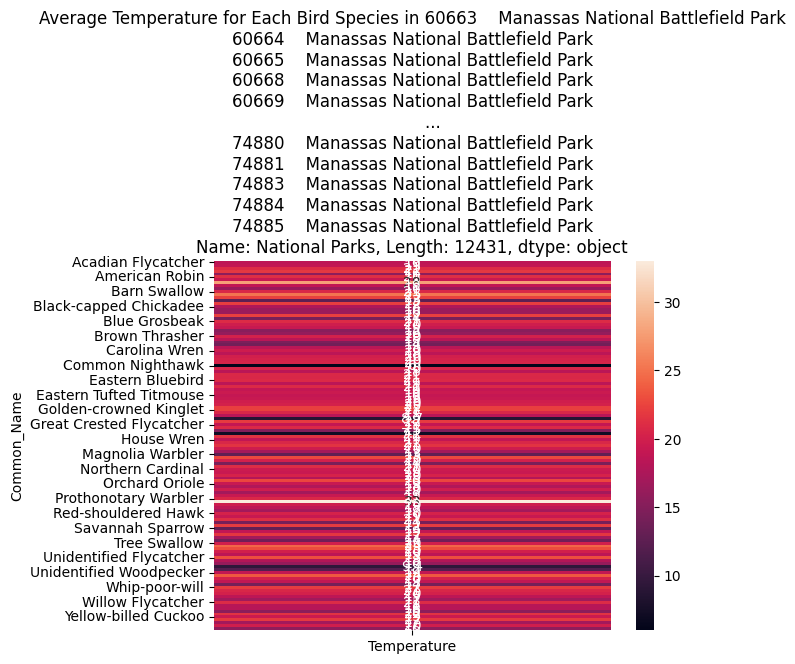

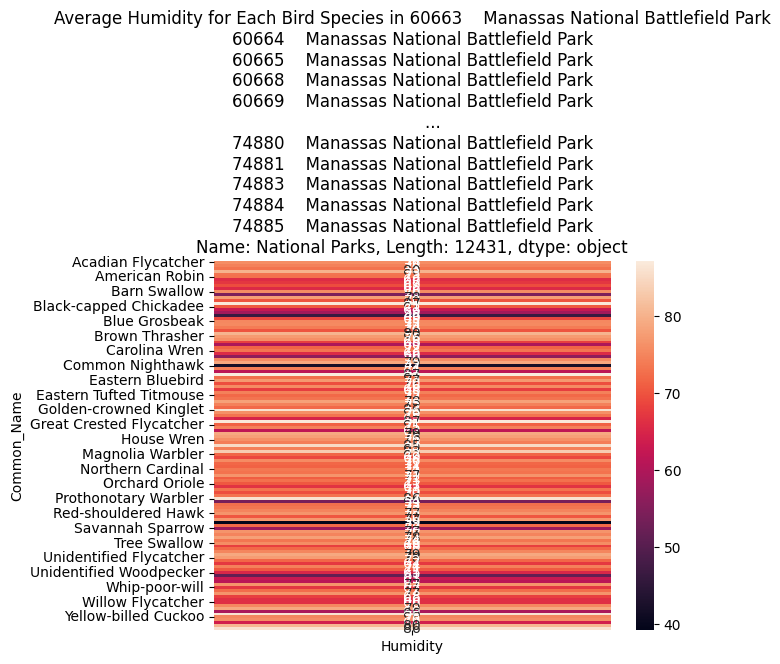

Analysis for Monocacy National Battlefield
              Year                           Date        Visit    AcceptedTSN  \
count  8268.000000                           8268  8268.000000    8241.000000   
mean   2015.612361  2016-01-21 04:31:52.336719872     1.829947  214322.209805   
min    2007.000000            2007-05-14 00:00:00     1.000000  174773.000000   
25%    2015.000000            2015-06-19 00:00:00     1.000000  178625.000000   
50%    2016.000000            2016-06-19 00:00:00     2.000000  179150.000000   
75%    2017.000000            2017-05-08 00:00:00     2.000000  179637.000000   
max    2017.000000            2017-07-14 00:00:00     3.000000  950061.000000   
std       1.721389                            NaN     0.777924  120594.399248   

        NPSTaxonCode  Temperature     Humidity  
count    8268.000000  8268.000000  8268.000000  
mean   109623.399492    19.847194    74.961877  
min         0.000000     4.600000     9.000000  
25%     85846.000000    15.6000

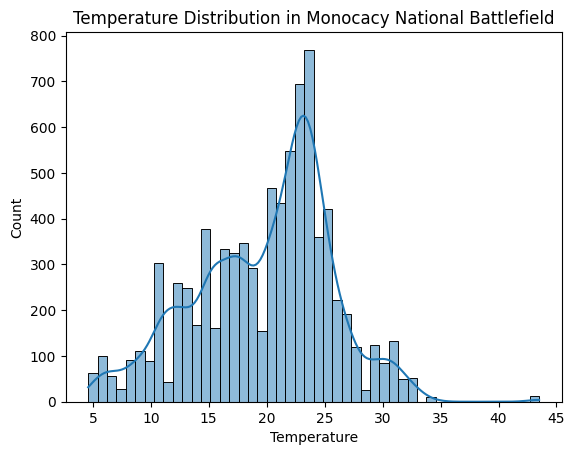

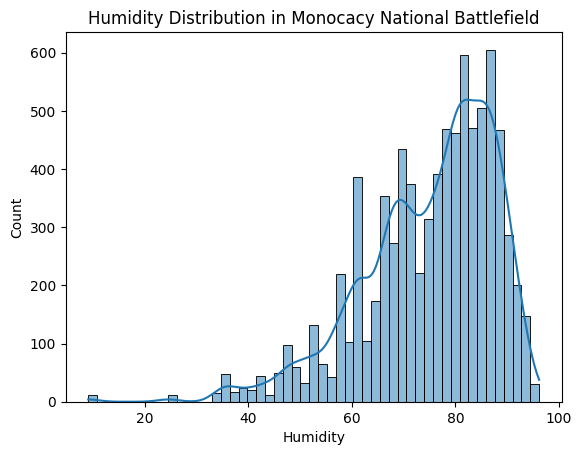

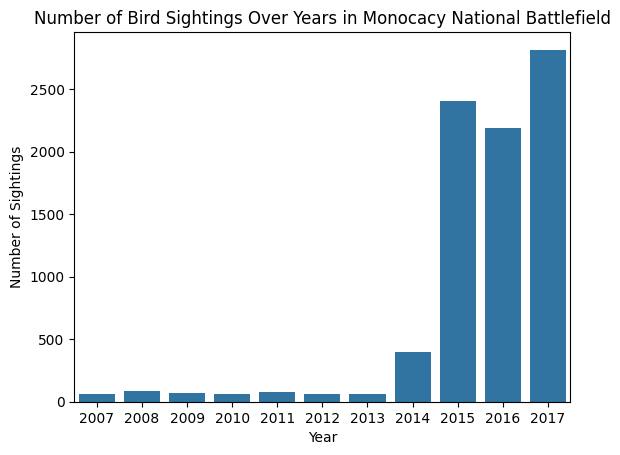

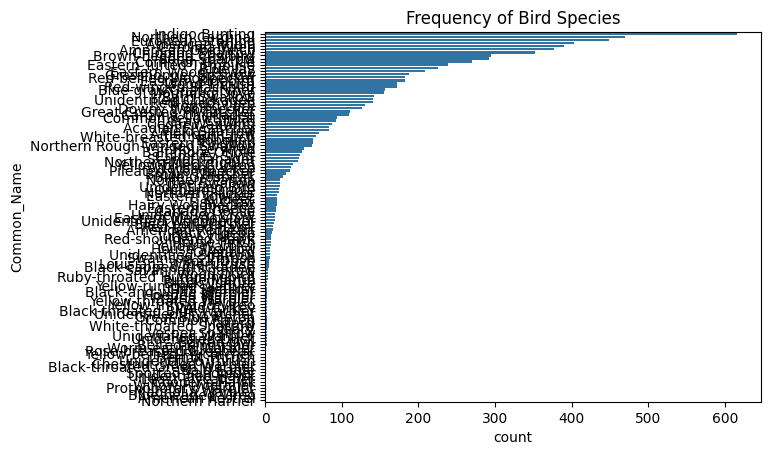

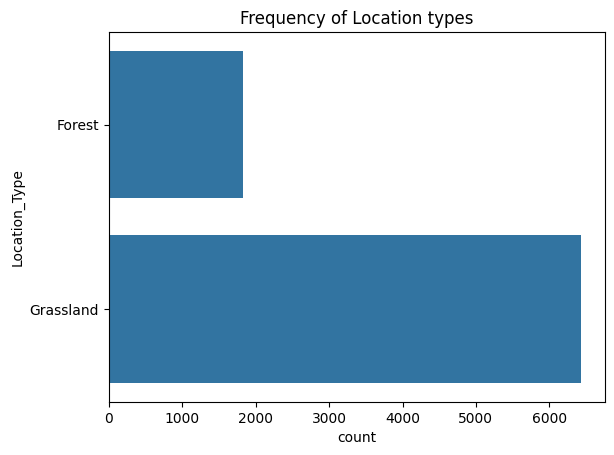

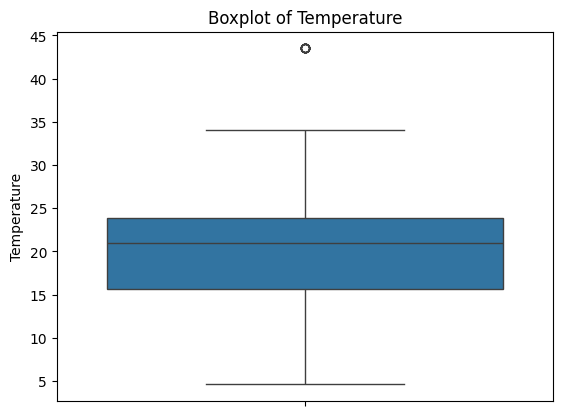

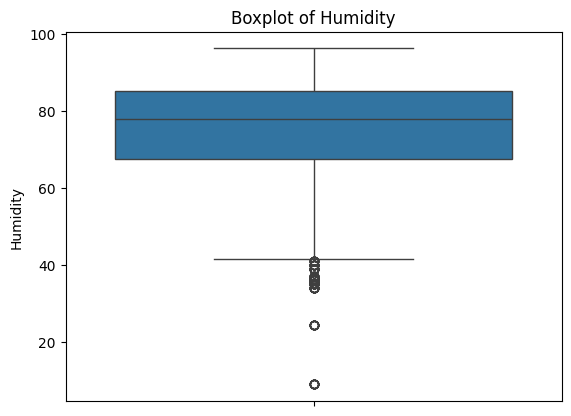

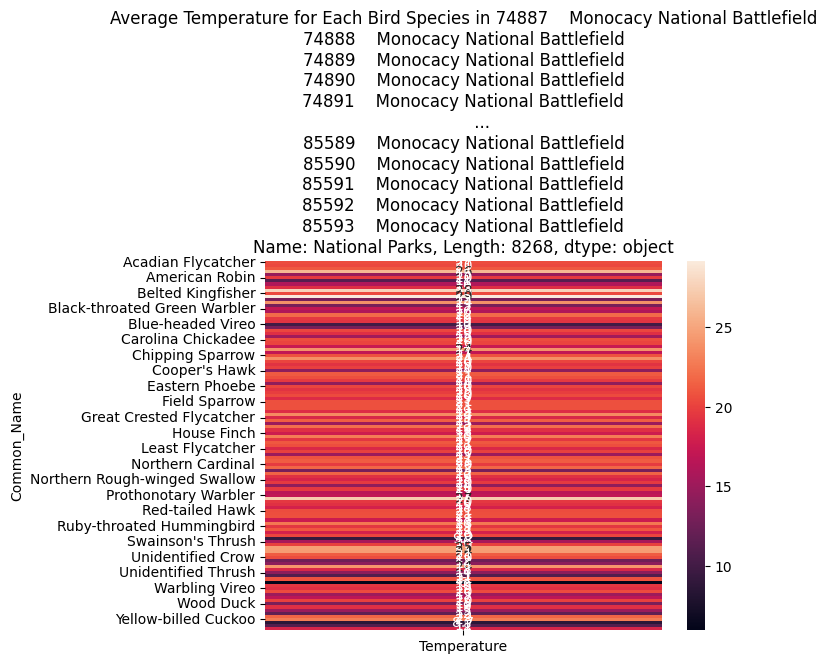

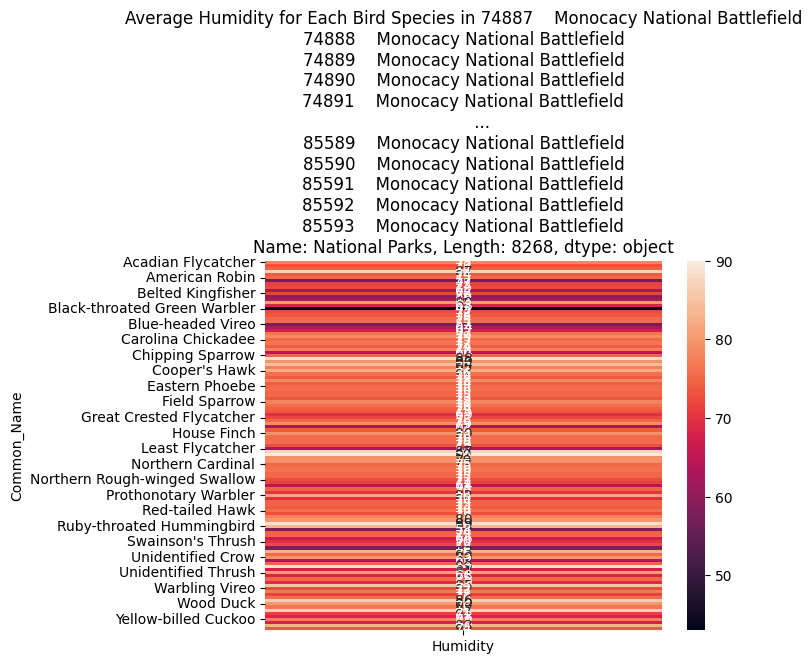

Analysis for National Capital Parks - East
              Year                           Date        Visit    AcceptedTSN  \
count  7468.000000                           7468  7468.000000    7447.000000   
mean   2011.773835  2012-03-20 13:09:59.678629120     1.483396  248466.096952   
min    2007.000000            2007-06-14 00:00:00     1.000000  174717.000000   
25%    2009.000000            2009-06-03 00:00:00     1.000000  178581.000000   
50%    2012.000000            2012-05-26 00:00:00     1.000000  179124.000000   
75%    2014.000000            2014-06-18 00:00:00     2.000000  179759.000000   
max    2017.000000            2017-06-14 00:00:00     2.000000  950097.000000   
std       3.159460                            NaN     0.499758  177841.238926   

        NPSTaxonCode  Temperature     Humidity  
count    7468.000000  7468.000000  7468.000000  
mean   137329.749063    20.614395    71.738534  
min         0.000000     0.000000     0.000000  
25%     86252.000000    18.1000

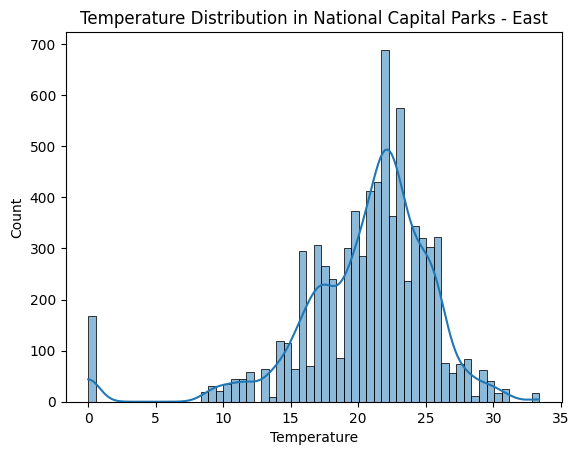

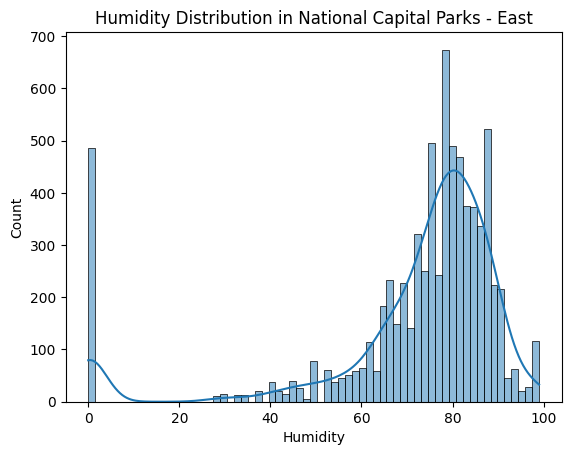

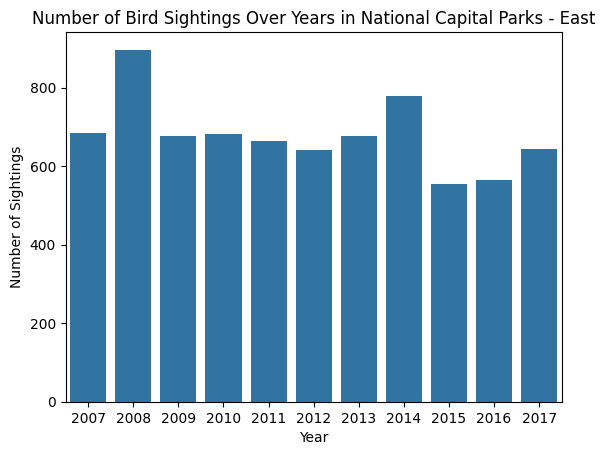

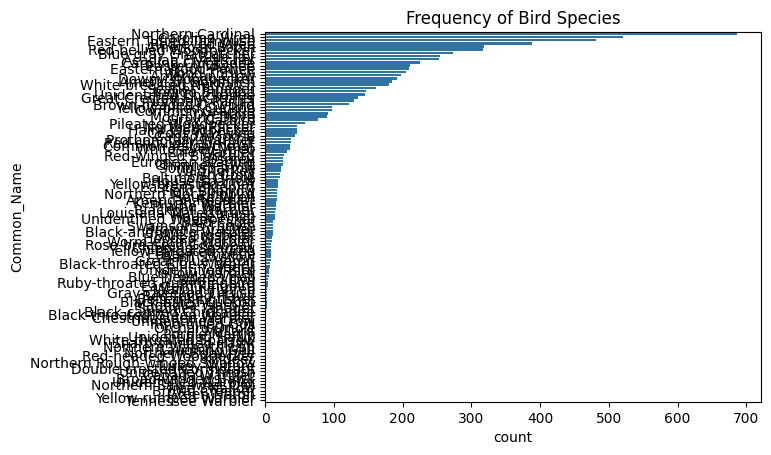

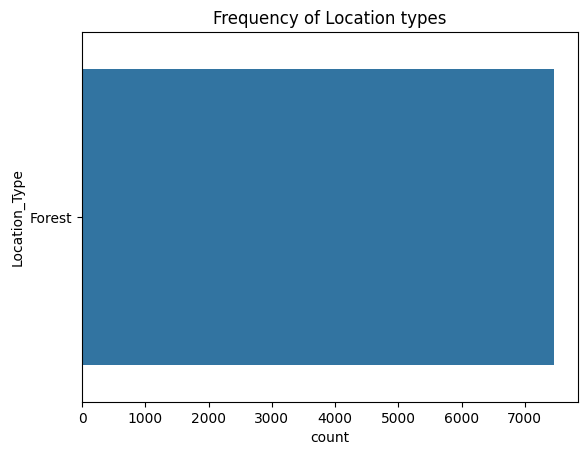

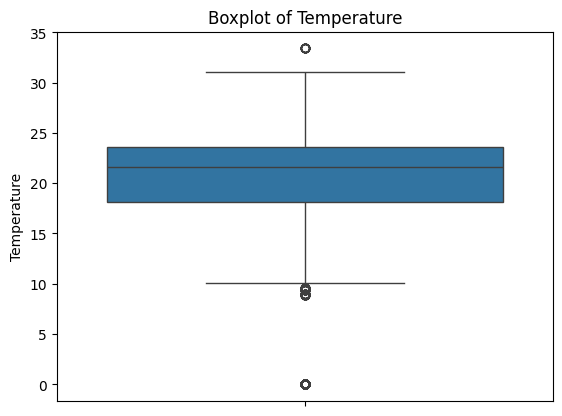

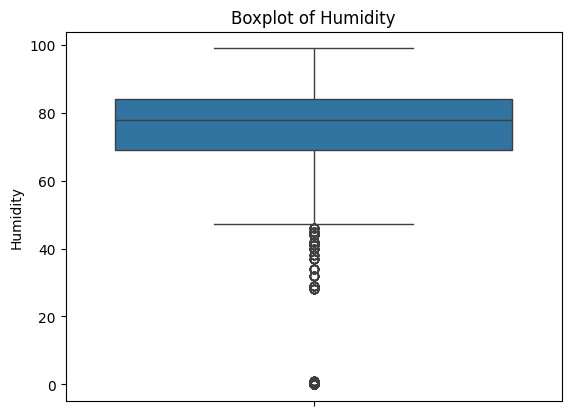

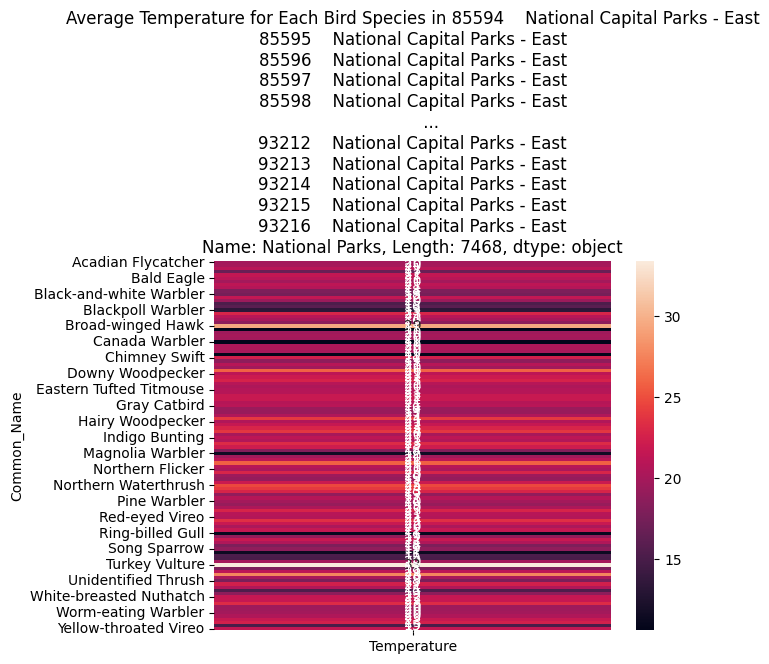

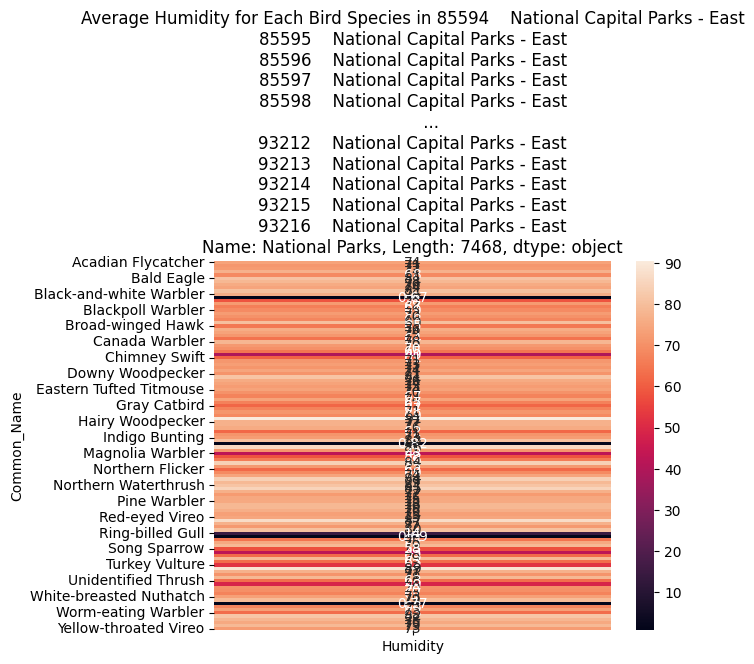

Analysis for Prince William Forest Park
               Year                           Date         Visit  \
count  28953.000000                          28953  28953.000000   
mean    2011.904535  2012-05-17 10:24:37.898663168      1.483611   
min     2007.000000            2007-05-29 00:00:00      1.000000   
25%     2009.000000            2009-07-07 00:00:00      1.000000   
50%     2012.000000            2012-07-01 00:00:00      1.000000   
75%     2014.000000            2014-06-28 00:00:00      2.000000   
max     2017.000000            2017-07-16 00:00:00      3.000000   
std        3.113727                            NaN      0.500085   

         AcceptedTSN   NPSTaxonCode   Temperature      Humidity  
count   28936.000000   28953.000000  28953.000000  28953.000000  
mean   261970.762338  151801.759058     21.060370     80.631148  
min    174773.000000       0.000000      0.000000      0.000000  
25%    178359.000000   85846.000000     19.000000     78.000000  
50%    179021.000

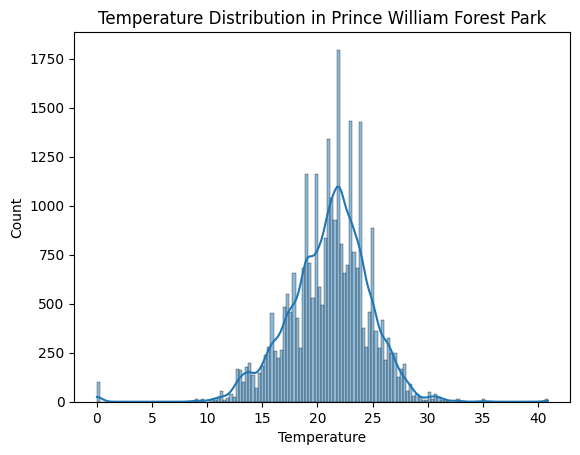

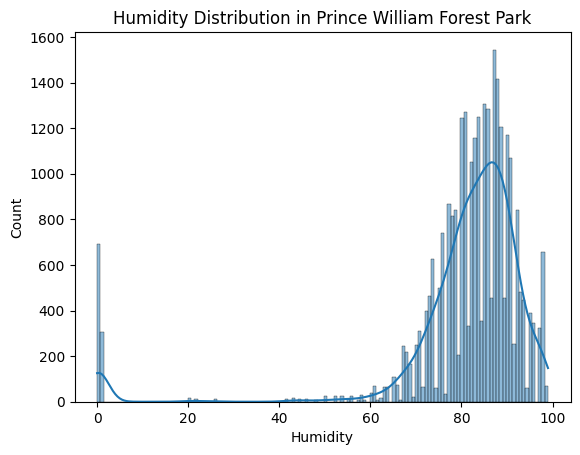

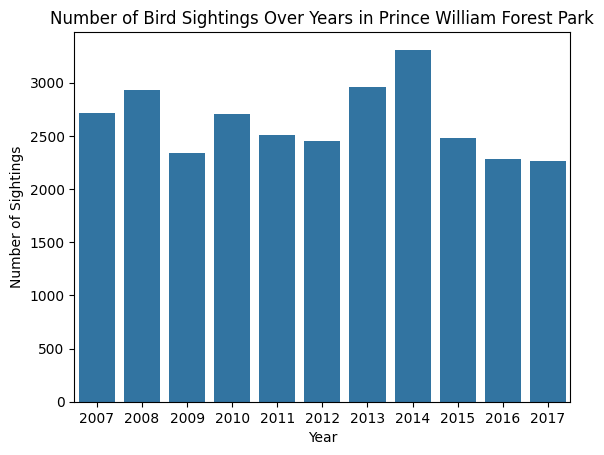

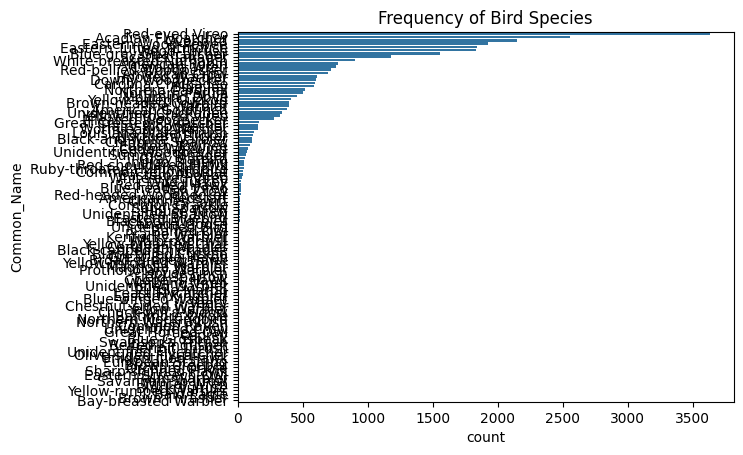

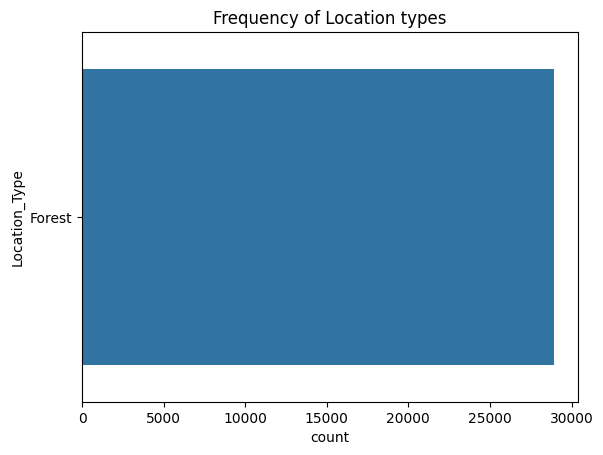

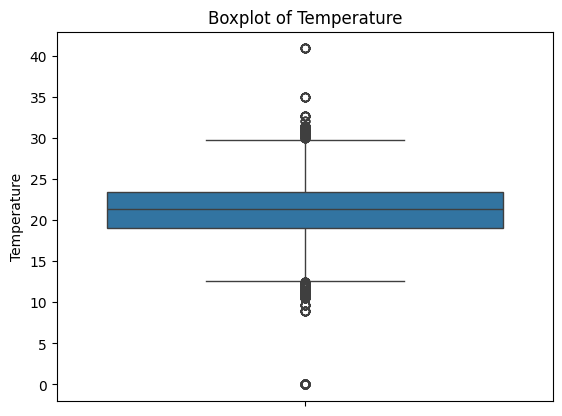

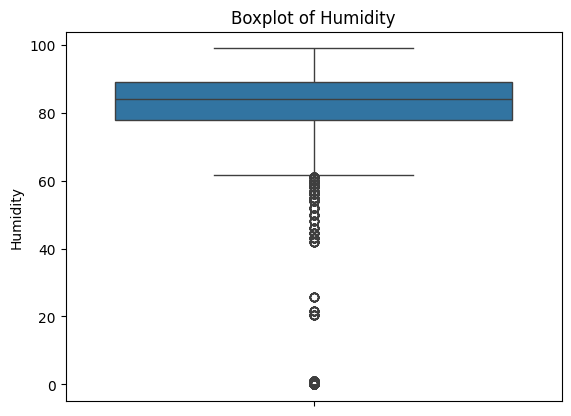

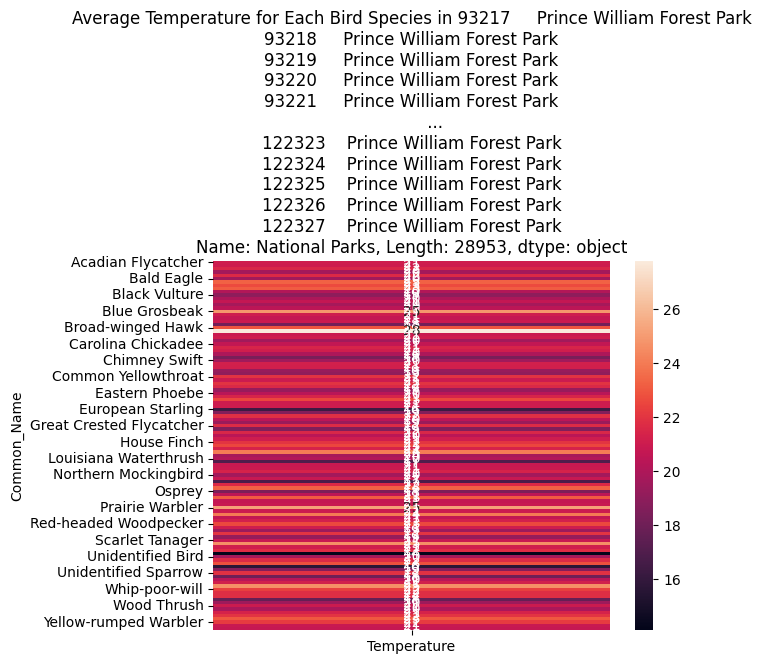

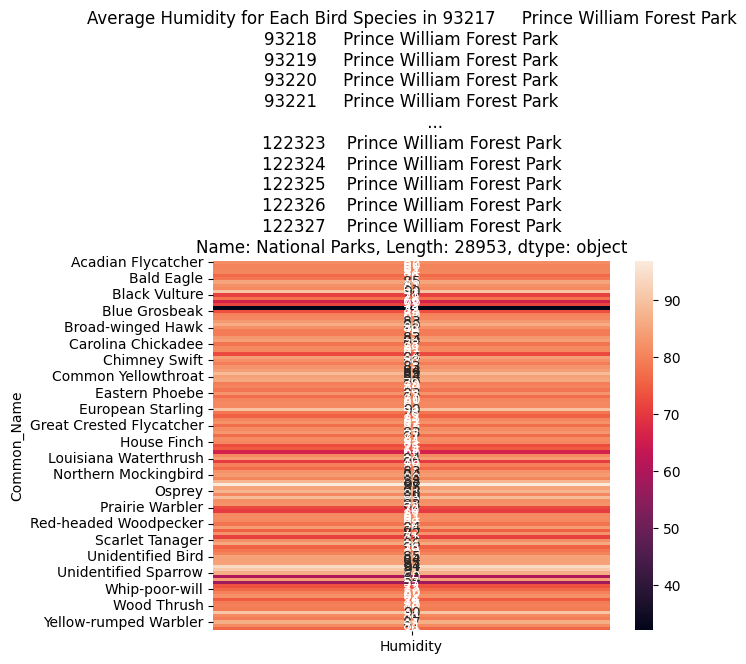

Analysis for Rock Creek Park
              Year                           Date        Visit    AcceptedTSN  \
count  3474.000000                           3474  3474.000000    3471.000000   
mean   2011.766552  2012-03-16 17:50:40.414507776     1.497985  224317.710170   
min    2007.000000            2007-05-09 00:00:00     1.000000  174773.000000   
25%    2009.000000            2009-05-30 00:00:00     1.000000  178359.000000   
50%    2012.000000            2012-05-29 12:00:00     1.000000  179124.000000   
75%    2014.000000            2014-06-23 00:00:00     2.000000  179759.000000   
max    2017.000000            2017-06-30 00:00:00     2.000000  950106.000000   
std       3.183408                            NaN     0.500068  141595.454676   

        NPSTaxonCode  Temperature     Humidity  
count    3474.000000  3474.000000  3474.000000  
mean   116237.136442    20.472107    70.097775  
min         0.000000    11.200000     0.000000  
25%     85824.000000    18.600000    68.00000

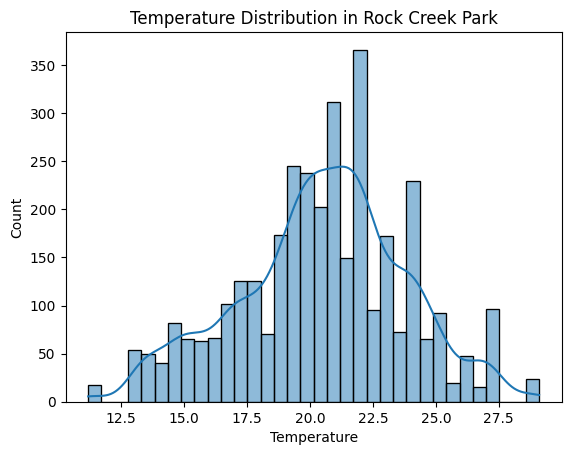

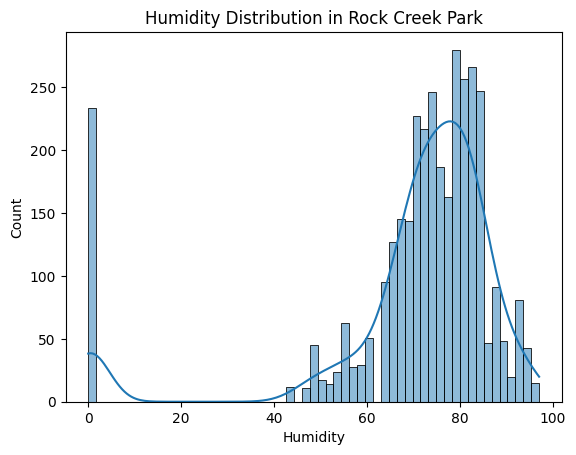

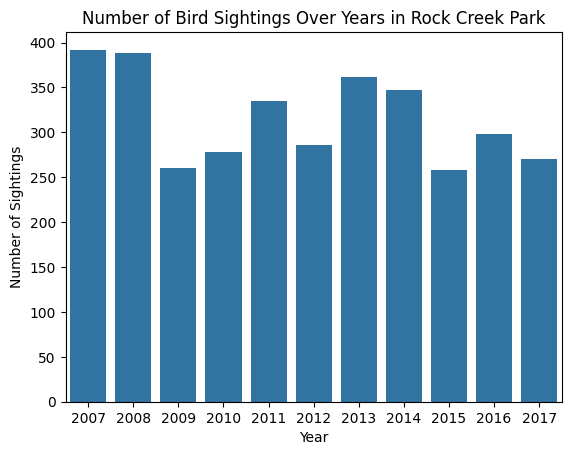

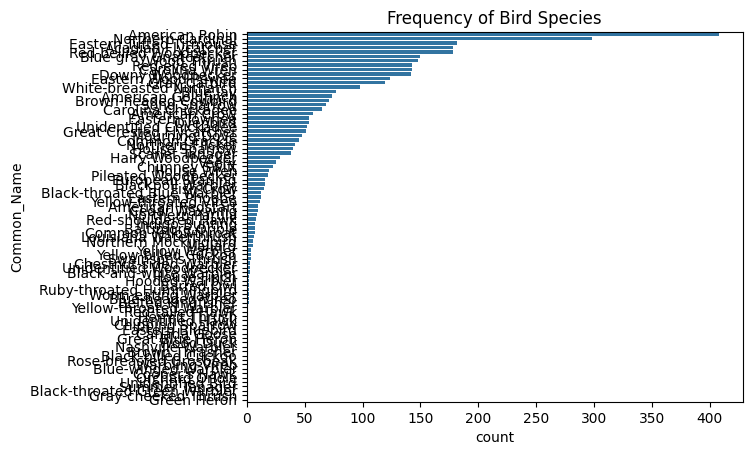

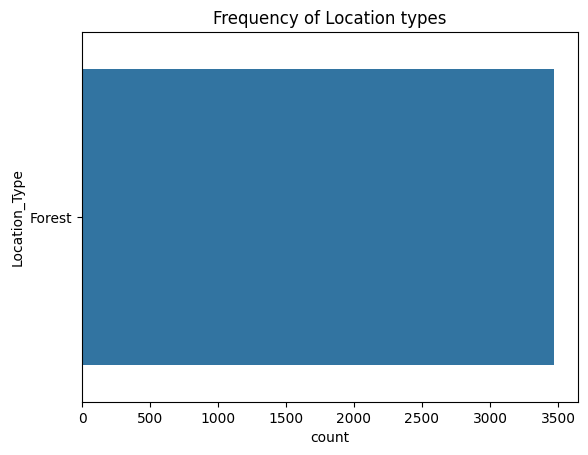

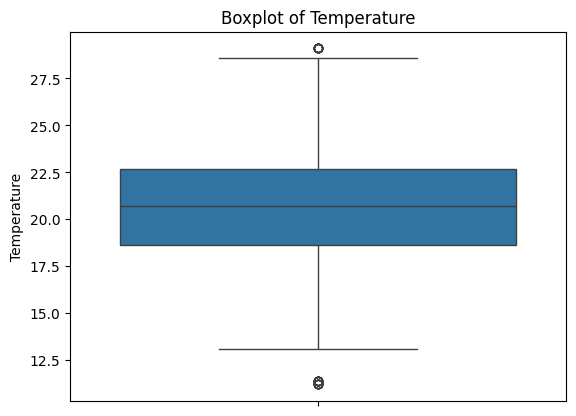

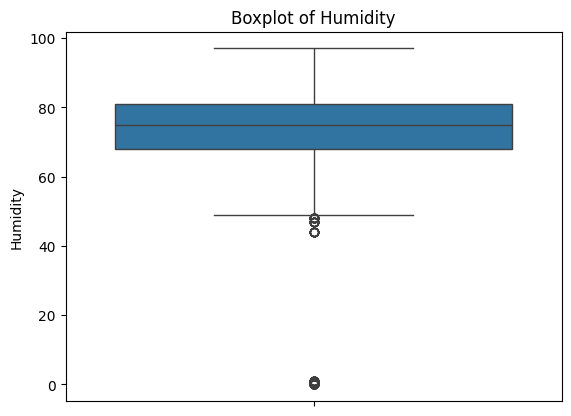

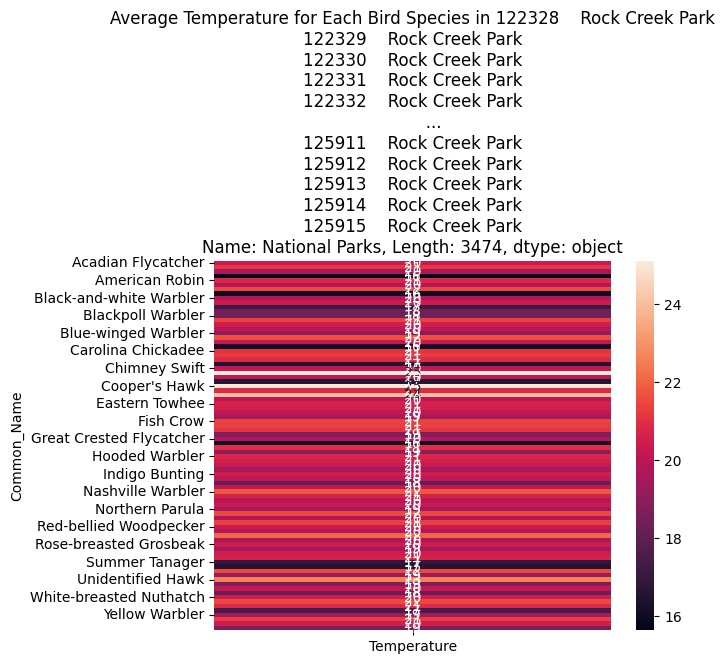

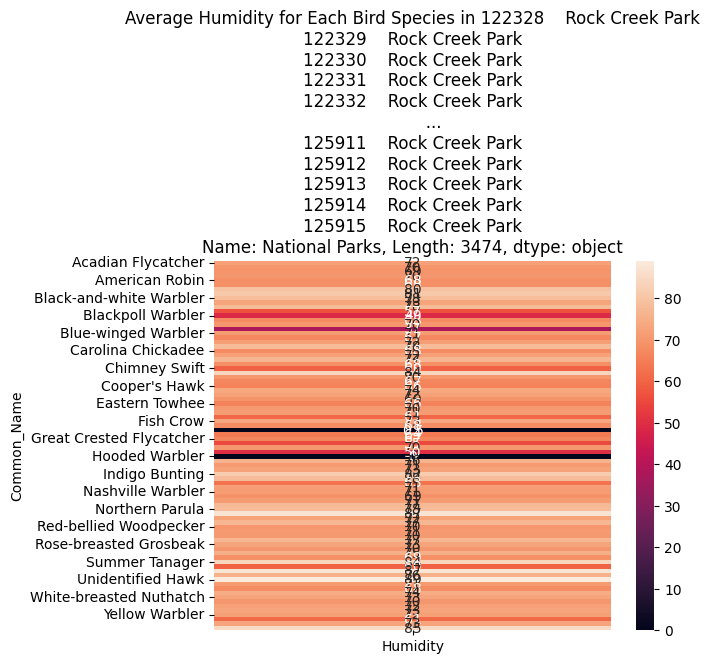

Analysis for Wolf Trap National Park for the Performing Arts
              Year                           Date       Visit    AcceptedTSN  \
count   633.000000                            633  633.000000     632.000000   
mean   2014.595577  2015-01-14 20:01:08.246445568    1.507109  247569.477848   
min    2007.000000            2007-05-10 00:00:00    1.000000  175265.000000   
25%    2014.000000            2014-06-06 00:00:00    1.000000  178541.000000   
50%    2015.000000            2015-05-29 00:00:00    2.000000  179124.000000   
75%    2016.000000            2016-06-22 00:00:00    2.000000  179759.000000   
max    2017.000000            2017-06-17 00:00:00    2.000000  950045.000000   
std       2.411230                            NaN    0.500345  148929.208876   

        NPSTaxonCode  Temperature    Humidity  
count     633.000000   633.000000  633.000000  
mean   124085.407583    22.094787   76.867931  
min     79468.000000    17.600000   36.000000  
25%     85846.000000    21

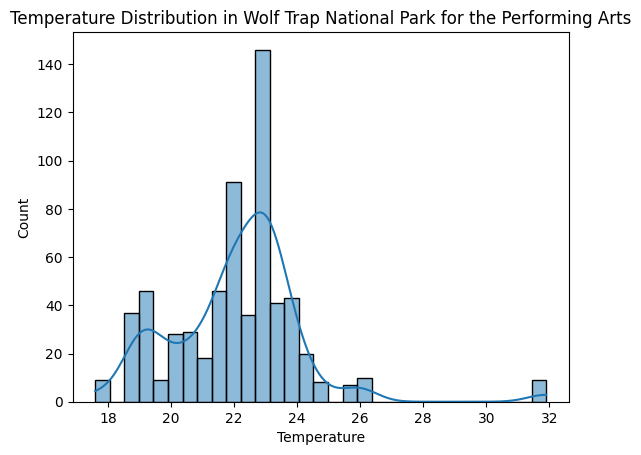

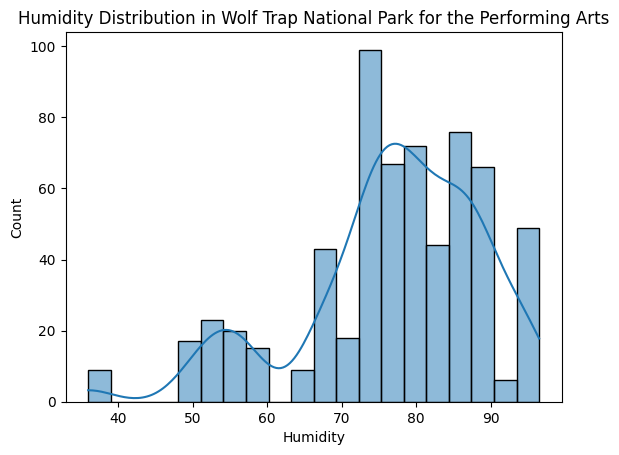

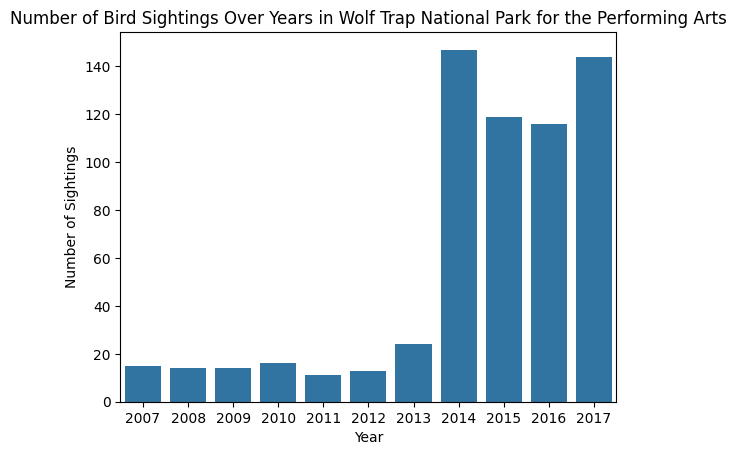

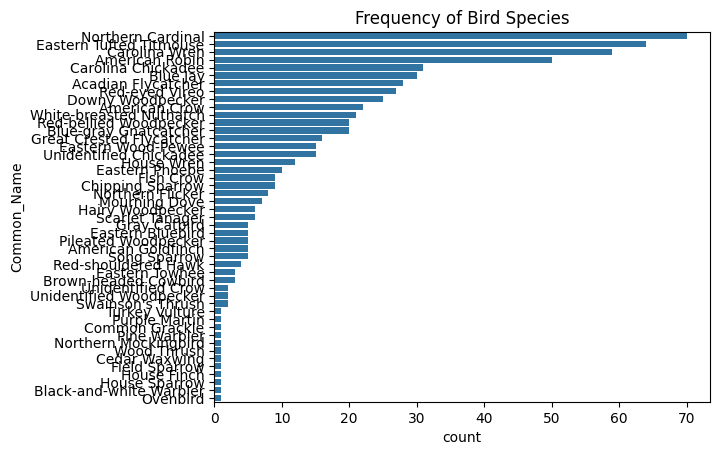

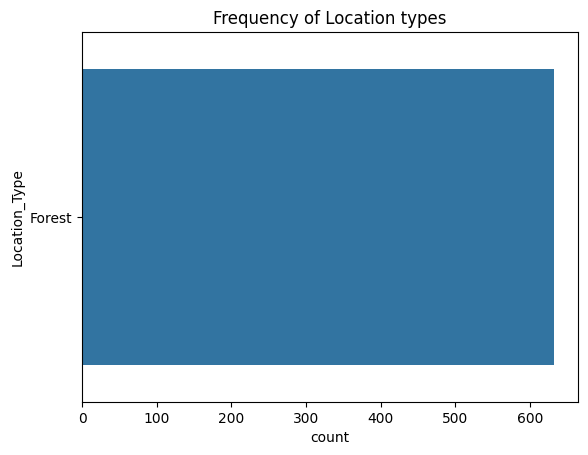

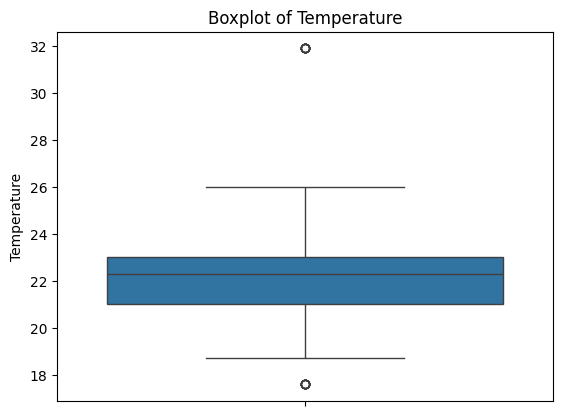

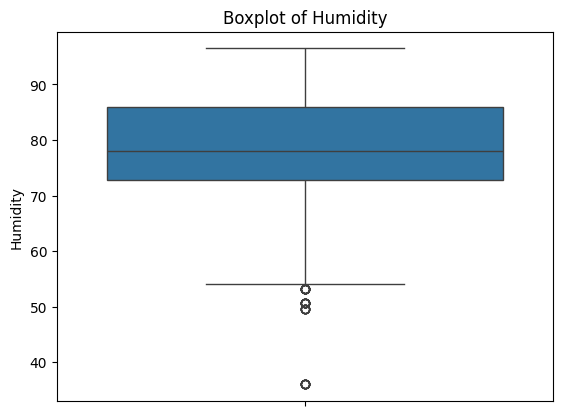

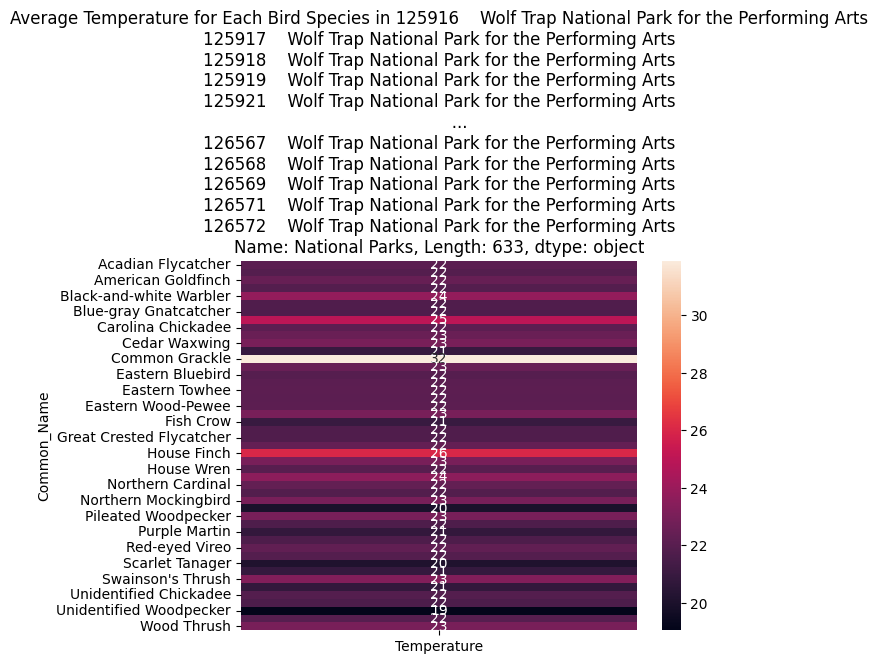

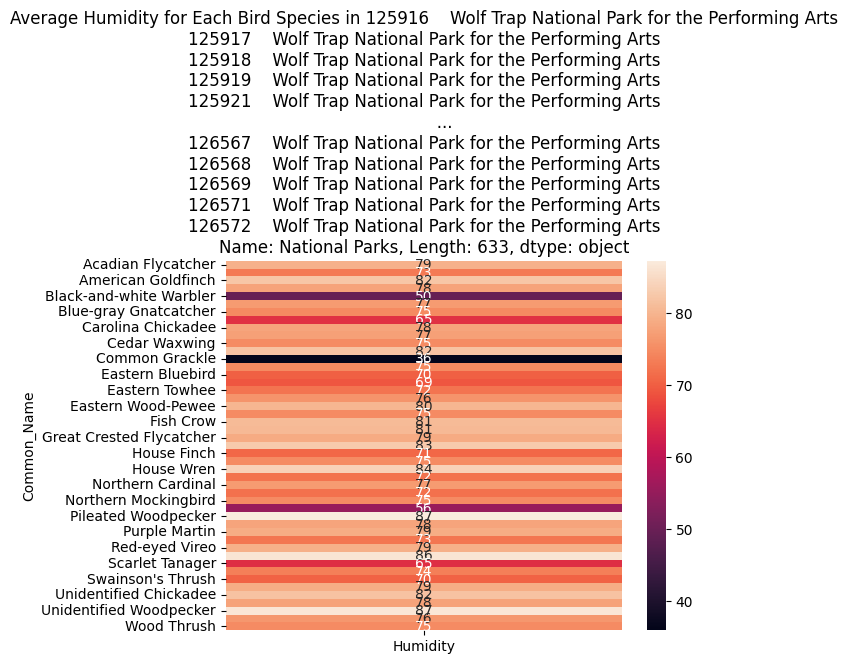

In [27]:
for park in parks:
    park_df=df[df['National Parks']==park]

    print(f"Analysis for {park}")
    print(park_df.describe())

    sns.histplot(park_df['Temperature'], kde=True)
    plt.title(f'Temperature Distribution in {park}')
    plt.show()

    sns.histplot(park_df['Humidity'], kde=True)
    plt.title(f'Humidity Distribution in {park}')
    plt.show()

    park_df.groupby('Year').size().plot()
    sns.barplot(park_df.groupby('Year').size())
    plt.title(f'Number of Bird Sightings Over Years in {park}')
    plt.xlabel('Year')
    plt.ylabel('Number of Sightings')
    plt.show()

    sns.countplot(y='Common_Name', data=park_df, order=park_df['Common_Name'].value_counts().index)
    plt.title('Frequency of Bird Species')
    plt.show()

    sns.countplot(park_df['Location_Type'])
    plt.title('Frequency of Location types')
    plt.show()

    sns.boxplot(park_df['Temperature'])
    plt.title('Boxplot of Temperature')
    plt.show()

    sns.boxplot(park_df['Humidity'])
    plt.title('Boxplot of Humidity')
    plt.show()

    pivot_table=park_df.pivot_table(values='Temperature', index='Common_Name', aggfunc='mean')
    sns.heatmap(pivot_table, annot=True)
    plt.title(f'Average Temperature for Each Bird Species in {park_df['National Parks']}')
    plt.show()

    pivot_table=park_df.pivot_table(values='Humidity', index='Common_Name', aggfunc='mean')
    sns.heatmap(pivot_table, annot=True)
    plt.title(f'Average Humidity for Each Bird Species in {park_df['National Parks']}')
    plt.show()

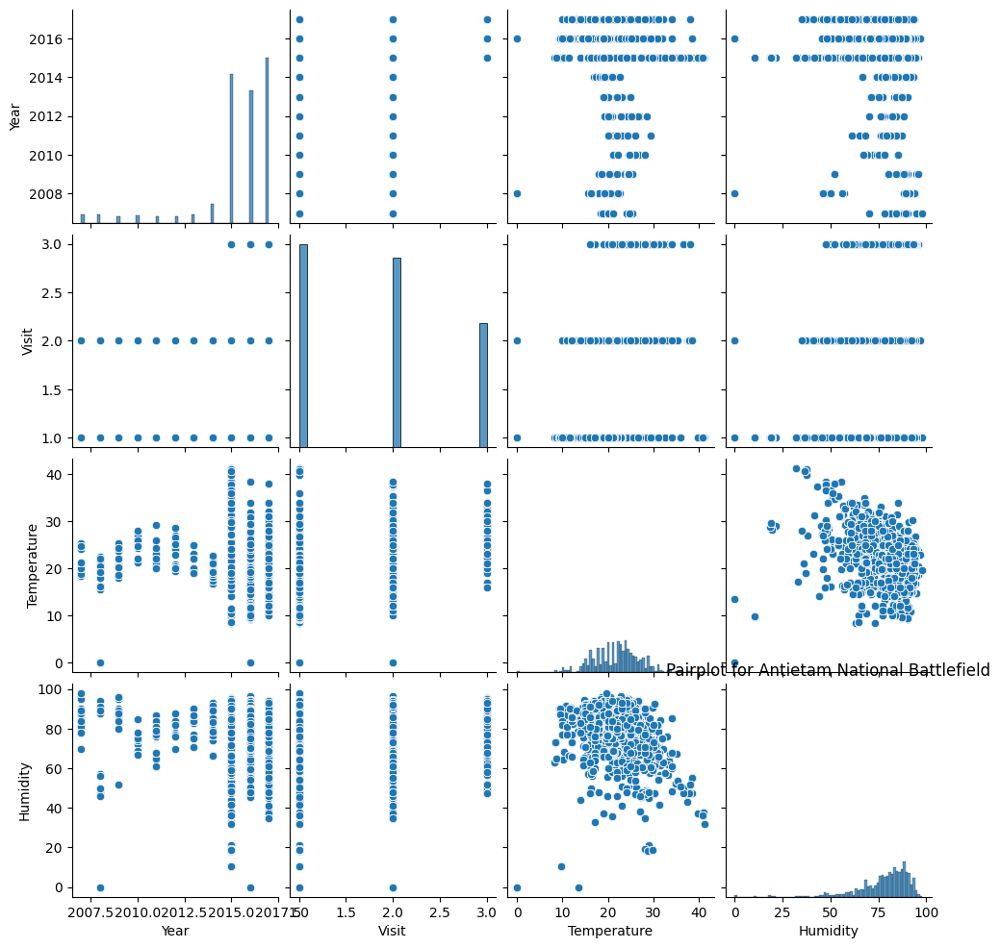

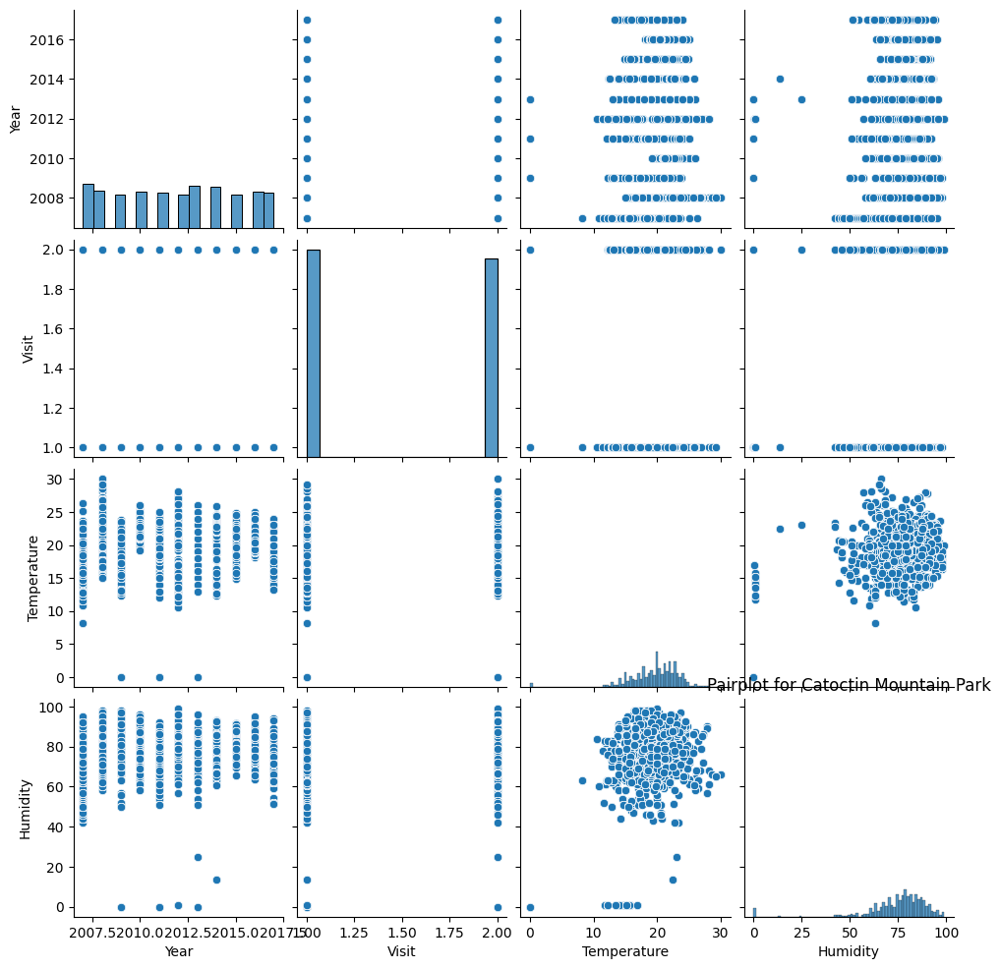

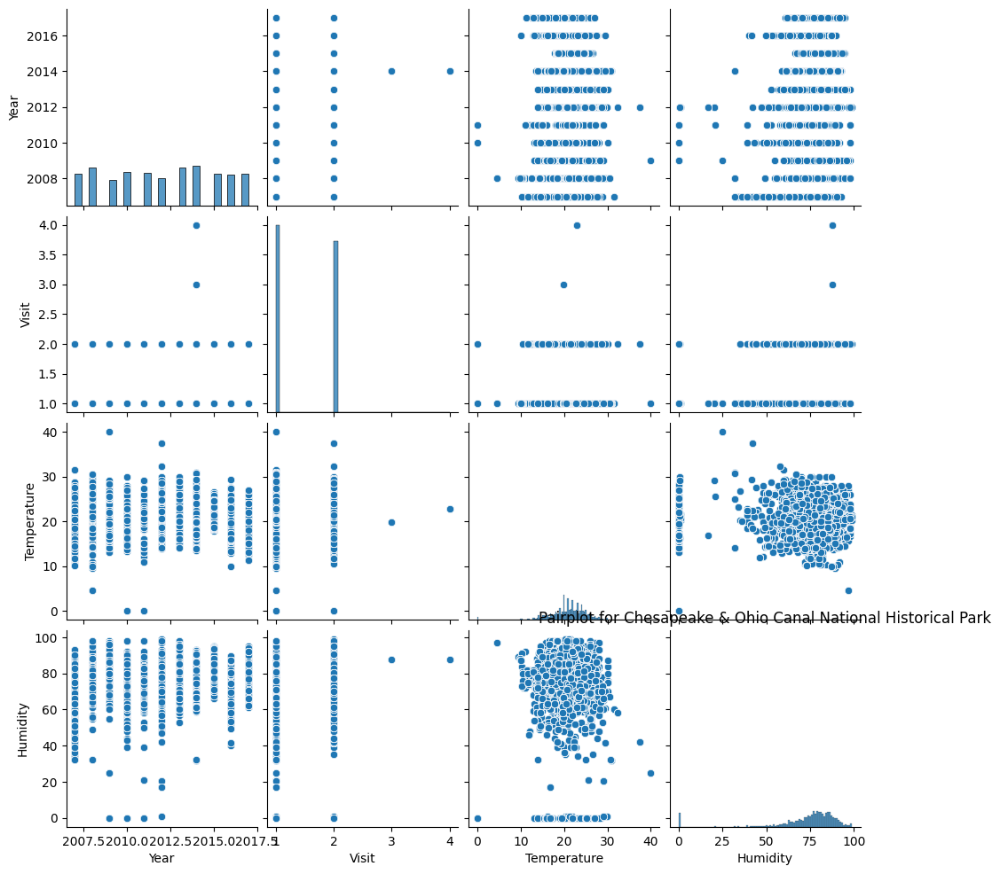

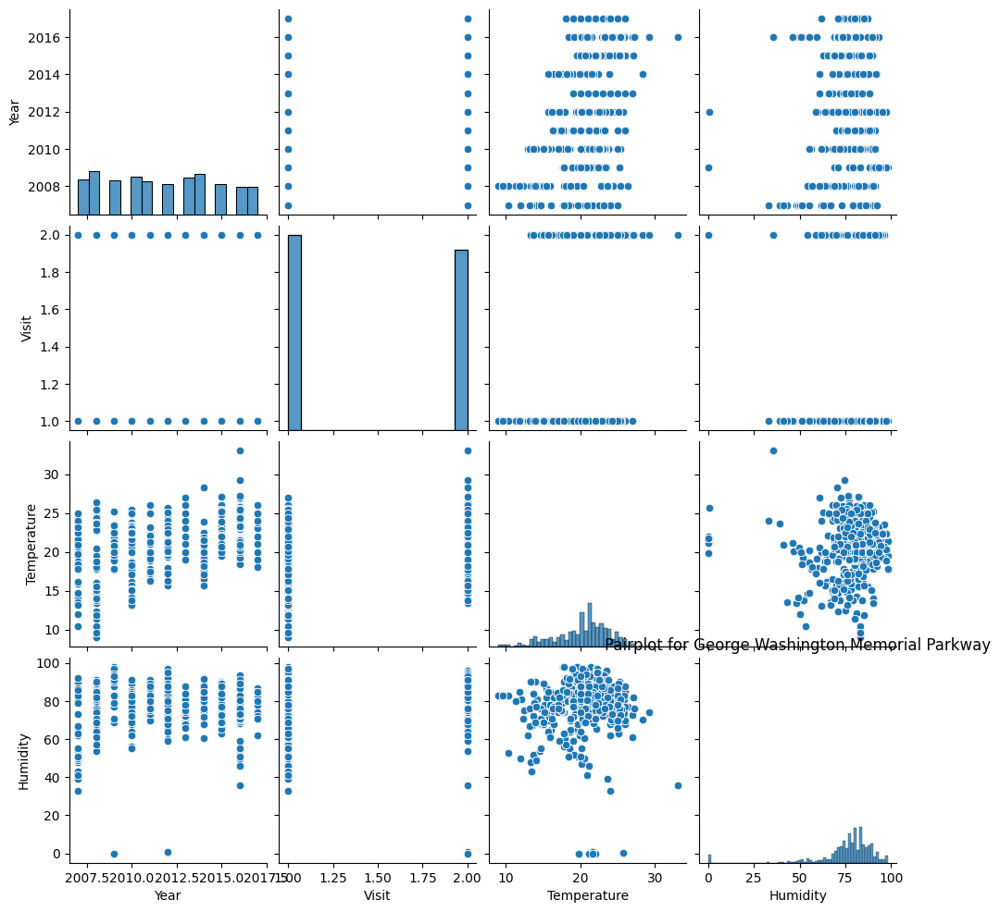

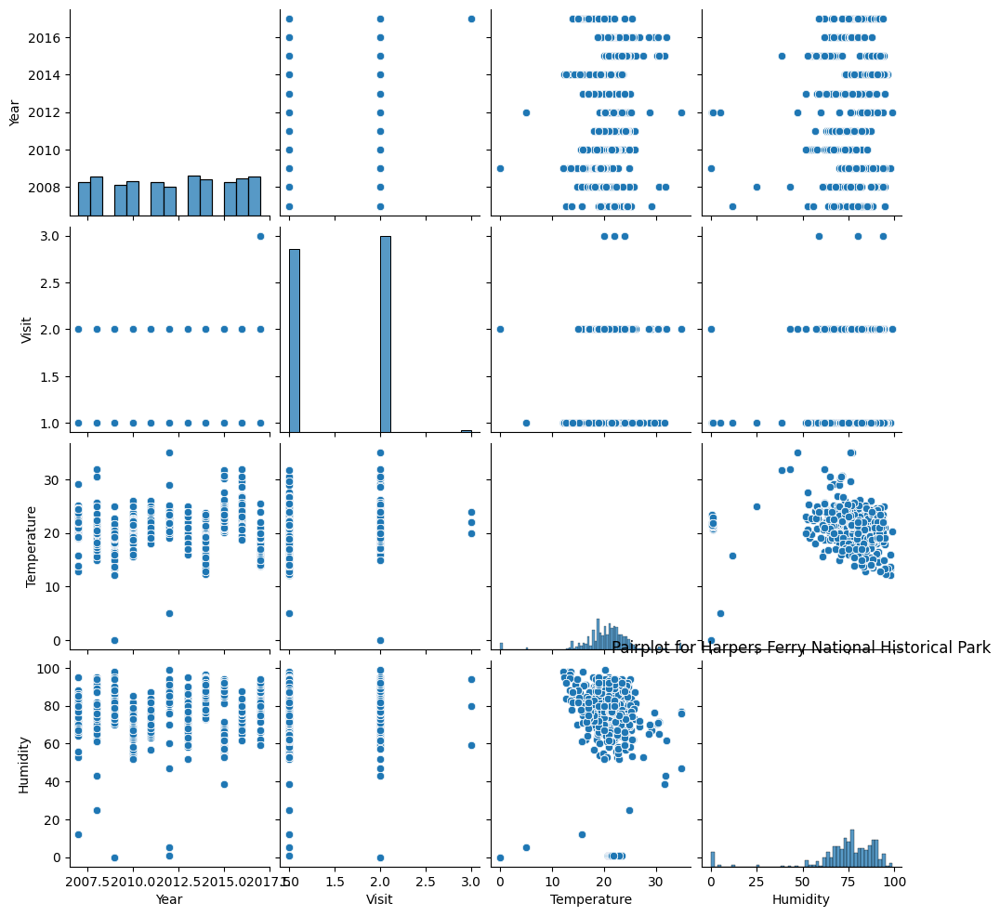

...

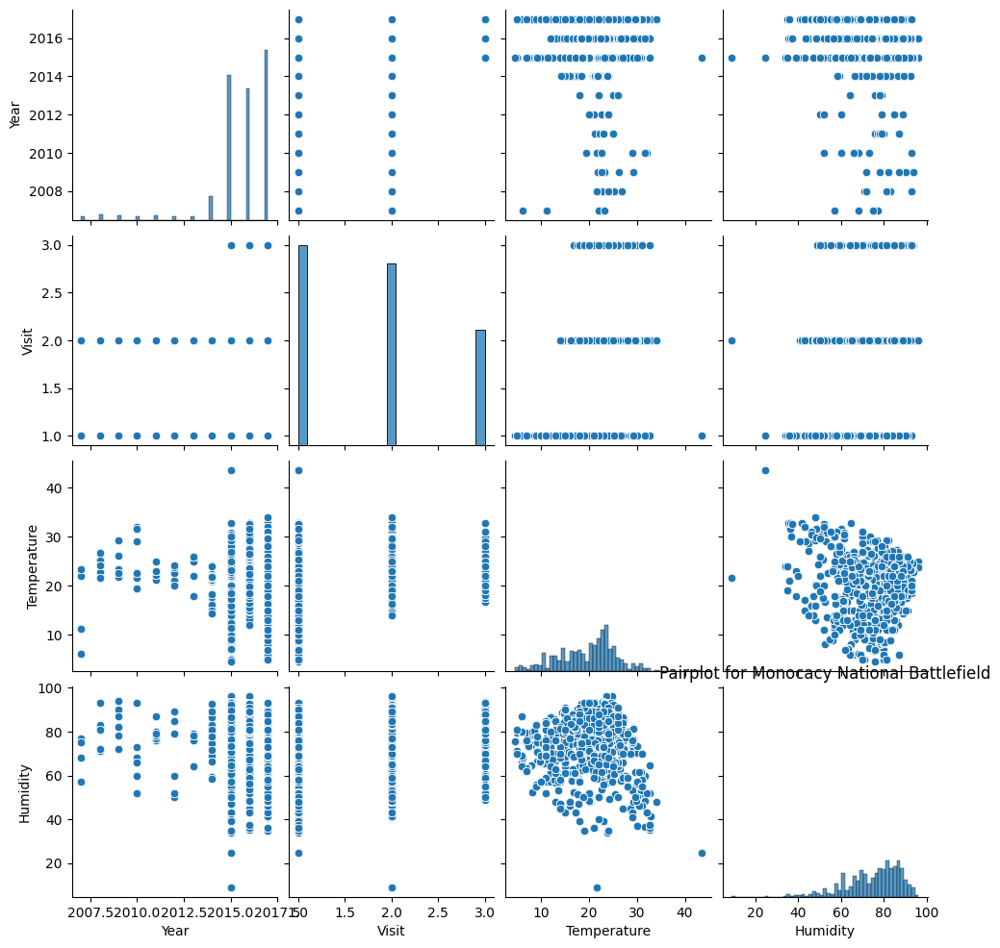

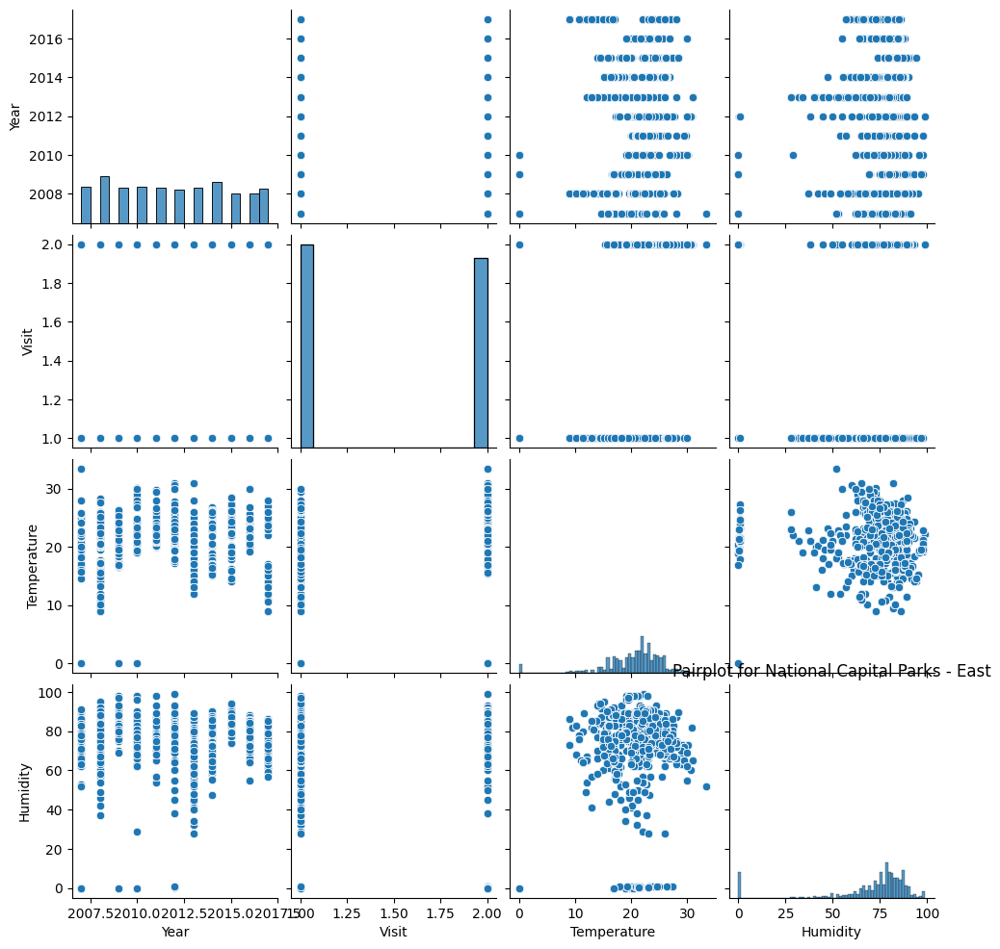

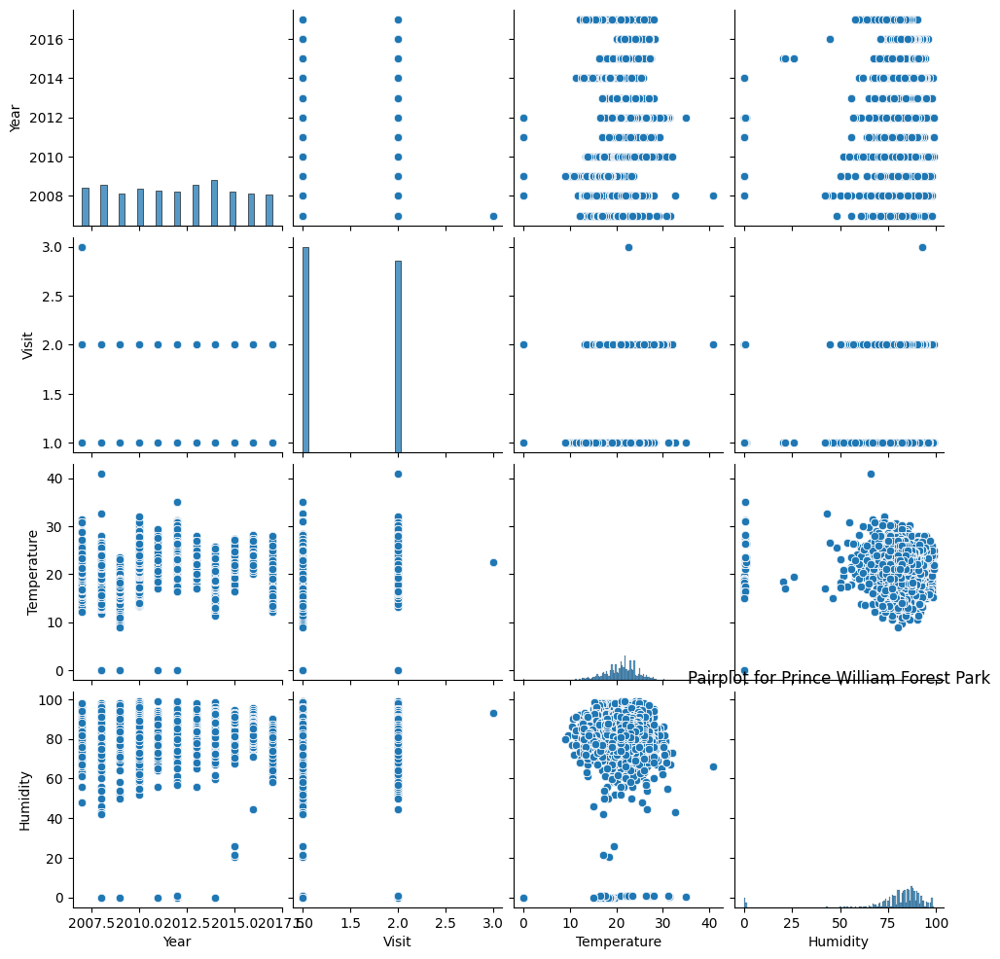

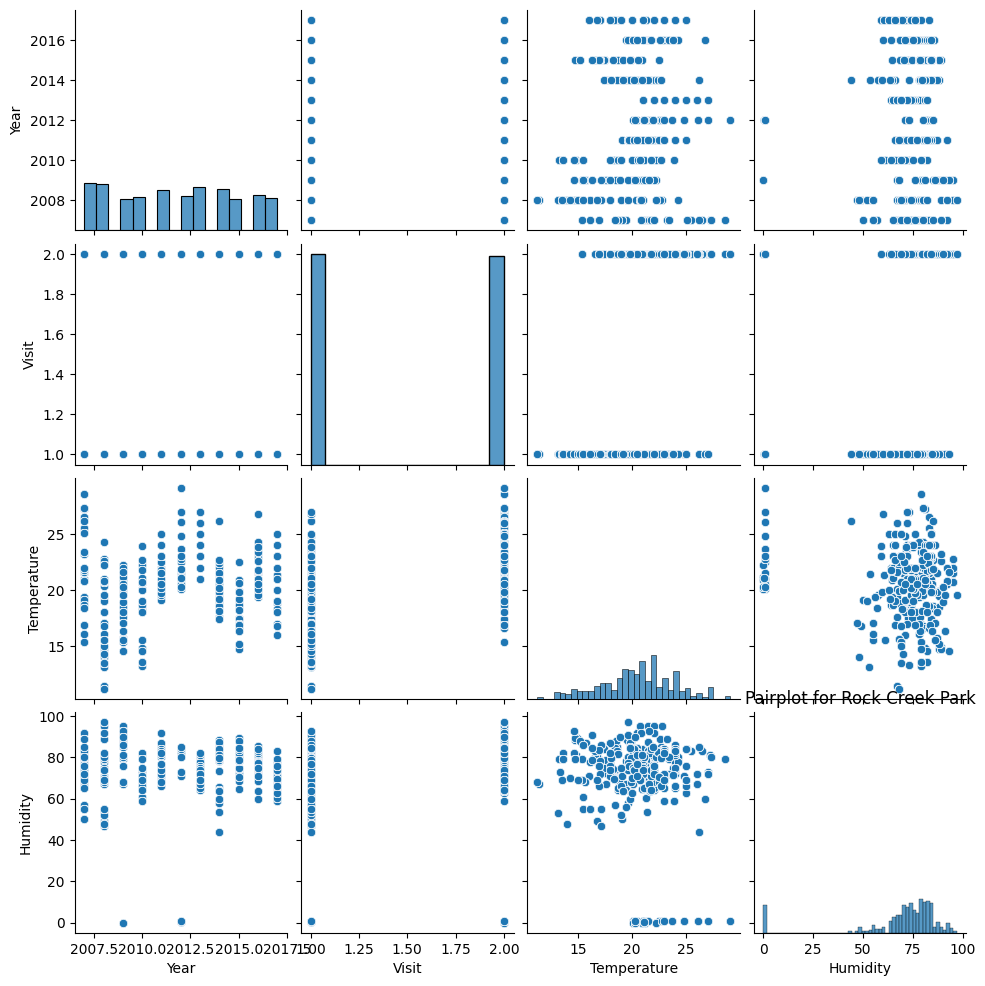

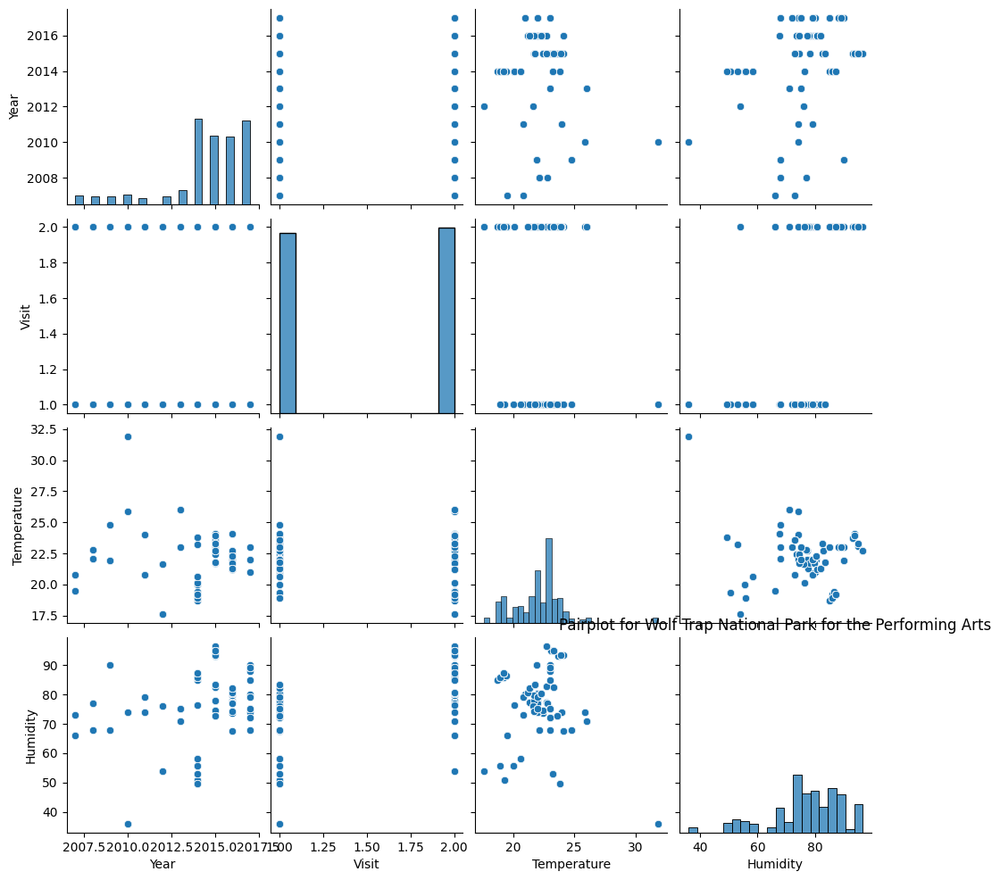

In [28]:
for park in parks:
    park_df=df[df['National Parks']==park]

    sns.pairplot(park_df[selected_num_cols])
    plt.title(f'Pairplot for {park}')
    plt.show()

In [29]:
plot_df=df[df['Plot_Name']=='HAFE-0118']

In [30]:
plot_df.sample(5)

,Admin_Unit_Code,Sub_Unit_Code,Site_Name,Plot_Name,Location_Type,Year,Date,Start_Time,End_Time,Observer,...,AOU_Code,PIF_Watchlist_Status,Regional_Stewardship_Status,Temperature,Humidity,Sky,Wind,Disturbance,Initial_Three_Min_Cnt,National Parks
56168,HAFE,NaN,HAFE 2,HAFE-0118,Forest,2009,2009-05-27,06:10:00,06:20:00,Zak Poulton,...,CACH,False,True,13.800000,78.0,Mist/Drizzle,Calm (< 1 mph) smoke rises vertically,Slight effect on count,True,Harpers Ferry National Historical Park
55278,HAFE,NaN,HAFE 2,HAFE-0118,Forest,2007,2007-05-17,06:46:00,06:56:00,Desiree Narango,...,GCFL,False,False,13.800000,83.0,Partly Cloudy,Calm (< 1 mph) smoke rises vertically,Slight effect on count,False,Harpers Ferry National Historical Park
57947,HAFE,NaN,HAFE 2,HAFE-0118,Forest,2013,2013-05-19,06:17:00,06:30:00,Elizabeth Tymkiw,...,TEWA,False,False,18.000000,71.0,Fog,Light air movement (1-3 mph) smoke drifts,No effect on count,False,Harpers Ferry National Historical Park
56626,HAFE,NaN,HAFE 2,HAFE-0118,Forest,2010,2010-05-22,06:39:00,06:49:00,Zach Ladin,...,ACFL,False,True,18.700001,62.0,Partly Cloudy,Calm (< 1 mph) smoke rises vertically,No effect on count,True,Harpers Ferry National Historical Park
60278,HAFE,NaN,HAFE 2,HAFE-0118,Forest,2017,2017-05-26,05:34:00,05:44:00,Meta Griffin,...,EAWP,False,True,17.000000,75.0,Cloudy/Overcast,Calm (< 1 mph) smoke rises vertically,Moderate effect on count,False,Harpers Ferry National Historical Park


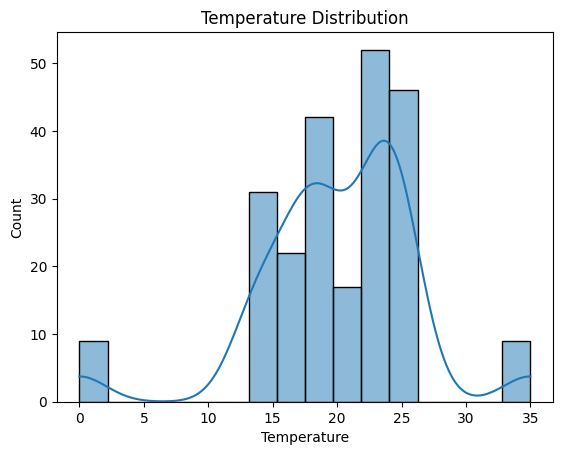

In [31]:
sns.histplot(plot_df['Temperature'], kde=True)
plt.title("Temperature Distribution")
plt.show()

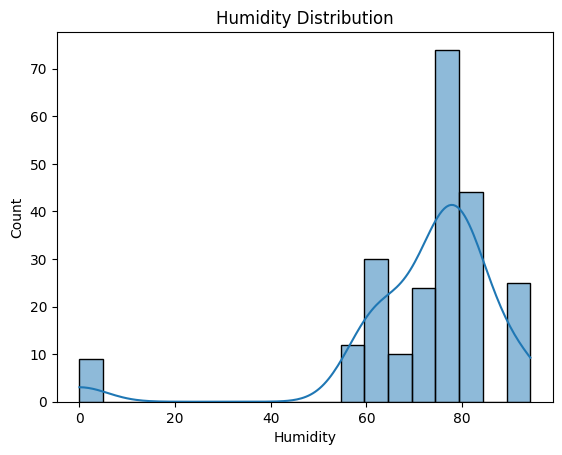

In [32]:
sns.histplot(plot_df['Humidity'], kde=True)
plt.title("Humidity Distribution")
plt.show()

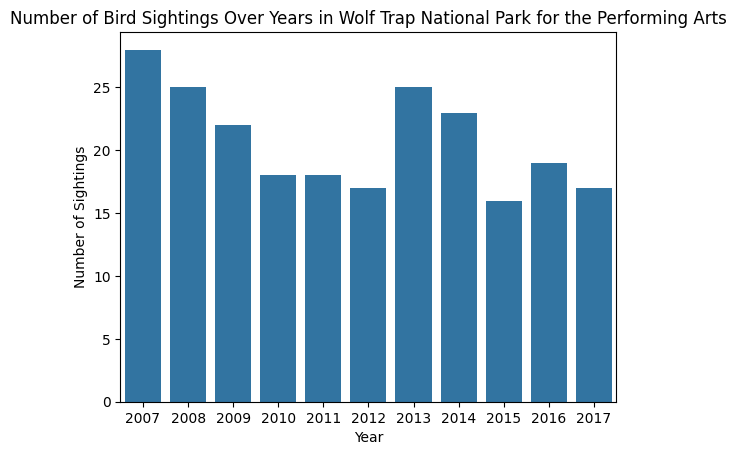

In [33]:
plot_df.groupby('Year').size().plot()
sns.barplot(plot_df.groupby('Year').size())
plt.title(f'Number of Bird Sightings Over Years in {park}')
plt.xlabel('Year')
plt.ylabel('Number of Sightings')
plt.show()

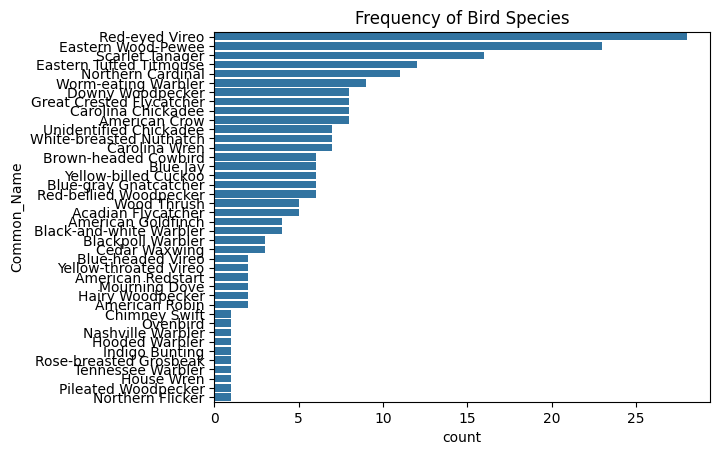

In [34]:
sns.countplot(y='Common_Name', data=plot_df, order=plot_df['Common_Name'].value_counts().index)
plt.title('Frequency of Bird Species')
plt.show()

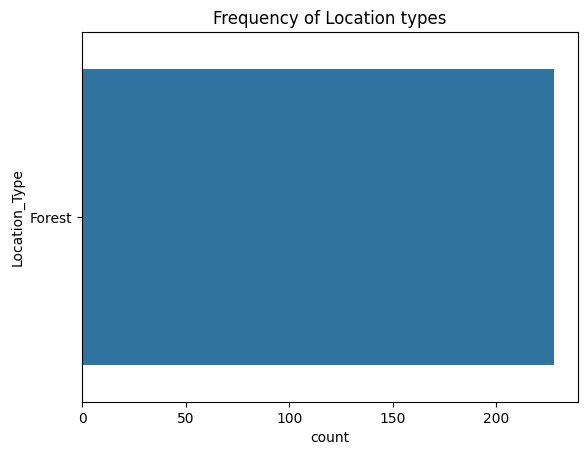

In [35]:
sns.countplot(plot_df['Location_Type'])
plt.title('Frequency of Location types')
plt.show()

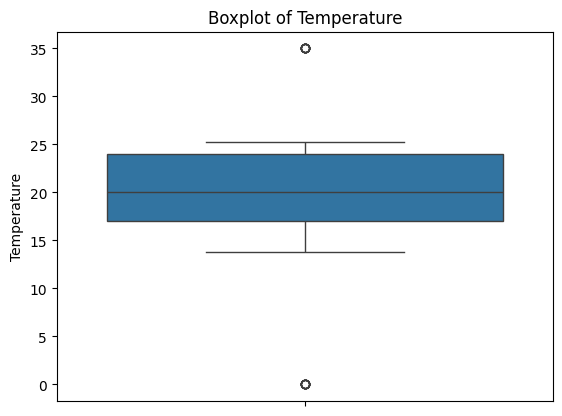

In [36]:
sns.boxplot(plot_df['Temperature'])
plt.title('Boxplot of Temperature')
plt.show()

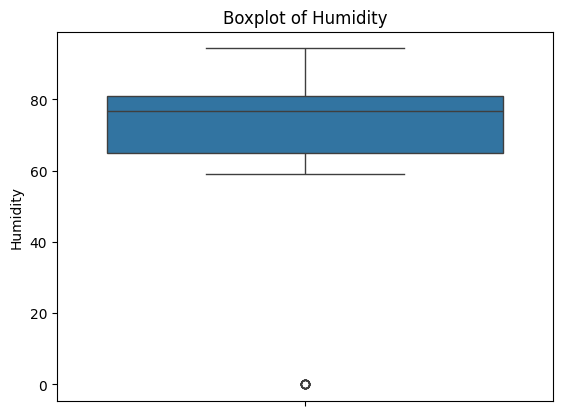

In [37]:
sns.boxplot(plot_df['Humidity'])
plt.title('Boxplot of Humidity')
plt.show()

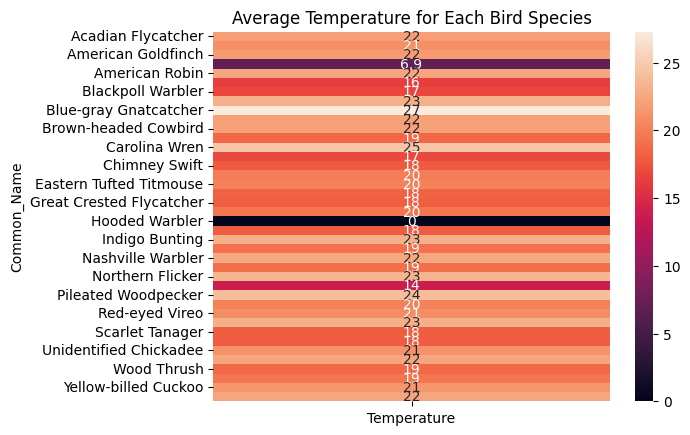

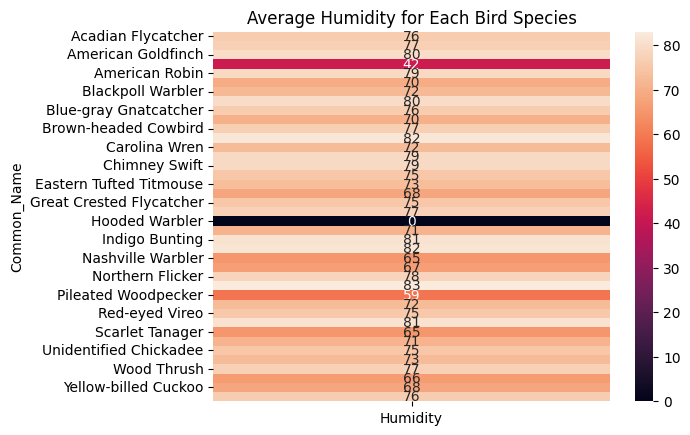

In [38]:
pivot_table=plot_df.pivot_table(values='Temperature', index='Common_Name', aggfunc='mean')
sns.heatmap(pivot_table, annot=True)
plt.title('Average Temperature for Each Bird Species')
plt.show()

pivot_table=plot_df.pivot_table(values='Humidity', index='Common_Name', aggfunc='mean')
sns.heatmap(pivot_table, annot=True)
plt.title('Average Humidity for Each Bird Species')
plt.show()

In [64]:
model_df=df.loc[:,['National Parks', 'Plot_Name', 'Year', 'Date', 'Location_Type', 'Common_Name', 'Temperature', 'Humidity', 'Sky', 'Wind', 'Disturbance']]

In [65]:
model_df['Month']=model_df['Date'].dt.month
model_df['Day']=model_df['Date'].dt.day
model_df.drop(columns=['Date'], inplace=True)

In [66]:
model_df=model_df.loc[:,['National Parks', 'Plot_Name', 'Year', 'Month', 'Day', 'Location_Type', 'Common_Name', 'Temperature', 'Humidity', 'Sky', 'Wind', 'Disturbance']]

In [67]:
model_df.sample(5)

,National Parks,Plot_Name,Year,Month,Day,Location_Type,Common_Name,Temperature,Humidity,Sky,Wind,Disturbance
73476,Manassas National Battlefield Park,MANA-0236,2015,5,25,Grassland,European Starling,30.600000,62.200001,Clear or Few Clouds,"Moderate breeze (13-18 mph), moves small branches",Slight effect on count
39846,Chesapeake & Ohio Canal National Historical Park,CHOH-0389,2008,6,12,Forest,Blue-gray Gnatcatcher,25.700001,65.000000,Clear or Few Clouds,Calm (< 1 mph) smoke rises vertically,Slight effect on count
73854,Manassas National Battlefield Park,MANA-0246,2014,7,6,Grassland,Red-winged Blackbird,19.100000,80.599998,Partly Cloudy,Light air movement (1-3 mph) smoke drifts,No effect on count
126082,Wolf Trap National Park for the Performing Arts,WOTR-0009,2014,6,23,Forest,Red-bellied Woodpecker,19.200001,85.900002,Clear or Few Clouds,Calm (< 1 mph) smoke rises vertically,Slight effect on count
112708,Prince William Forest Park,PRWI-0206,2014,6,1,Forest,Eastern Tufted Titmouse,16.200001,72.900002,Clear or Few Clouds,Calm (< 1 mph) smoke rises vertically,No effect on count


In [68]:
model_df.isnull().sum()

National Parks    0
Plot_Name         0
Year              0
Month             0
Day               0
Location_Type     0
Common_Name       0
Temperature       0
Humidity          0
Sky               0
Wind              0
Disturbance       0
dtype: int64

In [69]:
model_df.shape

(126455, 12)